
# Panel de Visualización de datos AirBnB Sidney                                
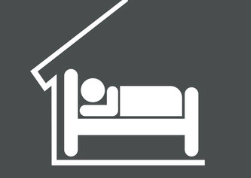 

Este Notebook es un procesamiento de datos para la creación de una herramienta para el análisis, visualización y predicción de datos de alquileres de piso para uso vacacional en la ciudad de Sidney (Australia), con base en datos colectados por la página AirBnB durante los años 2011 y 2019.

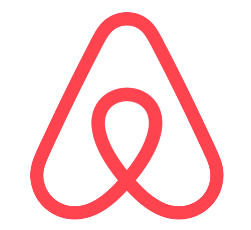   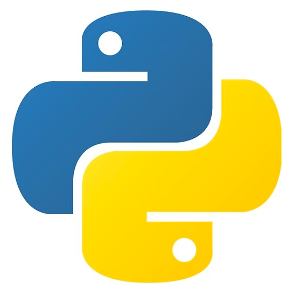  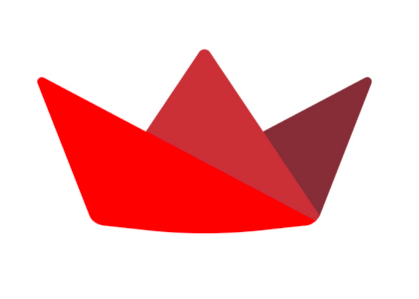

## Descripción de las variables del dataset

* **id**: Número de identificación de cada una de los alojamientos.
* **name**: Nombre de cada uno de los alojamientos.
* **host_id**:Número de identificación de cada uno de los huéspedes.
* **host_name**: Nombre de cada uno de los huéspedes.
* **neighbourhood_group**: Grupo de barrios en el que se encuentra el alojamiento.
* **neighbourhood**: Barrio en el que se encuentra el alojamiento.
* **latitude**: Latutud, en grados, en la que se encuentra el alojamiento.
* **longitude**: Longitud, en grados, en la que se encuentra el alojamiento.
* **room_type**: Tipo de alojamiento, según la clasificación de AirBnB, del que se trata.
* **price**: Precio por día del alojamiento.
* **minimum_nights**: Número mínimo de noches que se reserva un alojamiento.
* **number_of_review**s: Número total de opiniones que ha recibido un alojamiento desde que esta en AirBnB.
* **last_review**: Fecha de la última opinion que recibió un alojamiento.
* **reviews_per_month**: Número de opiniones que recibe un alojamiento a lo largo de un mes.
* **calculated_host_listings_count**: Número de alojamientos que tiene anunciados un mismo huésped en AirBnB.
* **availability_365**: Días en los que se puede reservar un alojamiento a lo largo de un año.


# 1. Importar librerías a utilizar en el análisis de datos y visualización

* **Instalación de paquetes**

In [149]:
#pip install statsmodels
#pip install streamlit_folium
#pip install streamlit
#pip install pingouin
#pip install io
#pip install scikit-learn

* **Llamado de librerías para EDA: análisis estadístico y visualización de datos.**

In [148]:
import pandas as pd
import random
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import itertools as it
import streamlit as st
from streamlit_folium import st_folium
import folium as folium    
from scipy import stats

In [146]:
import statsmodels.api as sm
import pingouin as pg
from scipy import stats
from scipy.stats import pearsonr


In [200]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.metrics import silhouette_score


# ----------------------------------------------------------------------------------------------

## Conclusiones de la exploración de datos e ingeniería de características.

* Se analizó una base de datos con total de 36662 entradas (filas) compuesta por variables numéricas y categóricas.
* Se encontró una columna nula la cual se eliminó.
* Las columnas last_review y review_per_month presentaron 12000 datos nulos, los cuales se remplazaron por "cero" y "nunca" respectivamente.
* Se reemplazaron los review_per_month==0 por los valores medios de su respctivo number_of_review.
* Los datos no presentan distribudión normal, al transformar el precio, es la única variable que se ajusta a la normalidad.
* Las correlaciones fueron muy bajas (<0.33), siendo el number_of_reviews y reviews_per_month las más correlacionadas.


# 2. Exploración inicial de datos

> ### 2.1. Importar base de datos .CSV y asignación a un DataFrame. 

In [106]:
pd.read_csv ('sydney_airbnb.csv')
df = pd.read_csv ('sydney_airbnb.csv')
df.head (2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,NaN,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321


> ### 2.2. Tipo de objetos (int,string, object, boolean, range).

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36662 entries, 0 to 36661
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              36662 non-null  int64  
 1   name                            36650 non-null  object 
 2   host_id                         36662 non-null  int64  
 3   host_name                       36656 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   36662 non-null  object 
 6   latitude                        36662 non-null  float64
 7   longitude                       36662 non-null  float64
 8   room_type                       36662 non-null  object 
 9   price                           36662 non-null  int64  
 10  minimum_nights                  36662 non-null  int64  
 11  number_of_reviews               36662 non-null  int64  
 12  last_review                     

* La base de datos tiene un total de  **36662 entradas** en **16 columnas**: **11 numéricas** y **5 cadenas de texto**.

* Tenemos pérdida de datos en "last_review" y "review_month".

* La columna neighbourhood_group está vacía, debemos analizar si eliminarla.



> ### 2.3. Información de filas.

* **Primeras filas** `.head`

Visualizamos las primeras 10 filas.

In [6]:
df.head (2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,NaN,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187
1,14250,Manly Harbour House,55948,Heidi,NaN,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321


##### * **Últimas filas** `.tail`

Visualizamos las últimas 5 filas.

In [7]:
df.tail (2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
36660,30592505,Bright Modern apartment in a Premiere location,229479027,Sofei & Kelvin,NaN,Rockdale,-33.929960,151.150659,Entire home/apt,170,2,0,NaN,NaN,1,89
36661,30593866,Huge Sunny Double Room with Spa in Best Location,51138070,Aaron & Natalie,NaN,Sydney,-33.906938,151.211255,Private room,80,5,0,NaN,NaN,3,11


> ### 2.4. Datos nulos (conteo e identificación): `.isnull()`

In [8]:
df.isnull().sum()

id                                    0
name                                 12
host_id                               0
host_name                             6
neighbourhood_group               36662
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       11937
reviews_per_month                 11937
calculated_host_listings_count        0
availability_365                      0
dtype: int64

* Tenemos pérdida de datos en **3 variables o columnas**: *name* ,*last_review* y *review_month*.

* Hay **1 columna vacía** *neighbourhood_group*, debemos analizar si eliminarla.

> ### 3.5. Datos duplicados (conteo e identificación): `.duplicated`

In [246]:
#datos duplicados en toda el DataFrame
df_dup = df[df.duplicated()]
len(df_dup)

0

In [10]:
dup_name = df[df.name.duplicated()] #También podemos ver los duplicados por columna
len(dup_name)

804

In [11]:
dup_hostname = df[df.host_name.duplicated()]
len(dup_hostname)

28787

* También podemos ver los valores por cada columna, por ejemplo por *neighbourhood* con `.value_counts` `.unique()`


In [12]:
neighbourhood_value = df.neighbourhood.value_counts ()
neighbourhood_value

Sydney              9241
Waverley            5467
Randwick            3346
Manly               1800
Warringah           1794
Woollahra           1573
North Sydney        1370
Marrickville        1252
Pittwater           1192
Leichhardt           999
Rockdale             729
Botany Bay           600
Ryde                 575
Mosman               534
Parramatta           520
Willoughby           500
Auburn               469
Sutherland Shire     468
Canada Bay           449
Hornsby              391
Ku-Ring-Gai          340
Canterbury           339
Ashfield             306
Lane Cove            289
The Hills Shire      260
Burwood              249
Blacktown            237
Hurstville           195
Bankstown            180
City Of Kogarah      179
Strathfield          171
Penrith              132
Holroyd              125
Liverpool            116
Campbelltown         101
Fairfield             76
Hunters Hill          69
Camden                29
Name: neighbourhood, dtype: int64

> ### 2.5. Nombre y tipo de variables (columnas).

* Las variables numéricas se pueden analizar con **estadísticas de datos agrupados** por subconjuntos o atributos de nuestros datos.

* Podemos calcular algunas **estadísticas básicas por columna** usando el comando `.describe()`

* Las variables categóricas se pueden analizar inicialmente con diagramas de **cajas y bigotes**.

In [103]:
# Variables Categóricas
categoricas = ["id", "host_id", "name", "host_name", "neighbourhood", "room_type", "last_review"] 

# Variables numéricas
numericas = ["latitude", "longitude", "price", "minimum_nights", "number_of_reviews", "reviews_per_month", "calculated_host_listings_count", "availability_365","log_price"]

# ----------------------------------------------------------------------------------------------

# 3. Ingeniería de características

> ## 3.1. Eliminación de *Datos Nulos*

* Borramos la columna inservible *"neighbourhood_group"*

In [107]:
df_filtrado=df.drop( ["neighbourhood_group"] ,axis = 1 )
df_filtrado.head (2)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187
1,14250,Manly Harbour House,55948,Heidi,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321


In [109]:
df_filtrado['price'].describe()

count    36662.000000
mean       207.689597
std        323.818795
min          0.000000
25%         80.000000
50%        136.000000
75%        223.000000
max      14999.000000
Name: price, dtype: float64

* También podemos extraer una métrica en particular:`.min()`  `.max()` `.mean()` `.mean()` `.std()` `.count()`

In [16]:
df_filtrado['price'].min()
#df_filtrado['price'].max()
#df_filtrado['price'].mean()
#df_filtrado['price'].std()
#df_filtrado['price'].count()

0

> ## 3.2. Detección de *Outliers*

#### Detección gráfica y con Zscore de valores atípicos

* Se hizo una primera detección de *outliers* de manera visual a través de las gráficas de dispersión de datos y boxplots.
* A continuacion se realizaron gráficos más específicos para la detección de *outliers*

* Gráfico outliers
* Box plot horizontal
* Zscore

#### Detección gráfica y con Zscore de outliers de `"price"`

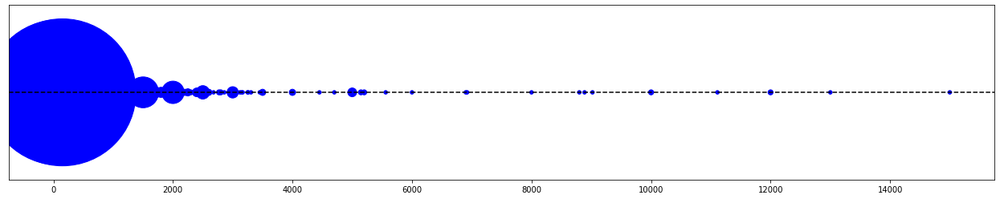

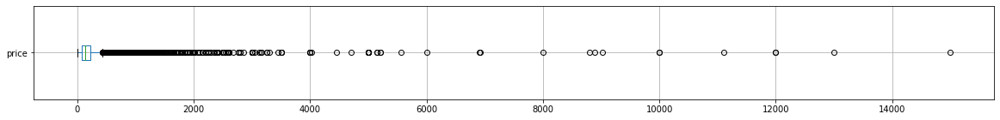

-Se detecta con Zscore > 3, valor de outliers para 'price' a partir de:


1179

In [10]:
price = df_filtrado.iloc[:, 8]
price_unique, counts = np.unique(price, return_counts=True)
 
sizes = counts*20
colors = ['blue']*len(price_unique)

plt.figure(figsize=(22,4))
plt.axhline(1, color='k', linestyle='--')
plt.scatter(price_unique, np.ones(len(price_unique)), s=sizes, color=colors)
plt.yticks([])
plt.show()

df.boxplot(column='price', return_type='axes', vert=False, figsize=(20,2))
plt.show()
print("-Se detecta con Zscore > 3, valor de outliers para 'price' a partir de:")
df_filtrado1 = df_filtrado[(np.abs(stats.zscore(df_filtrado["price"])) < 3)]
df_filtrado1['price'].max()

- Detección gráfica y con Zscore de outliers de `"minimum_nights"`

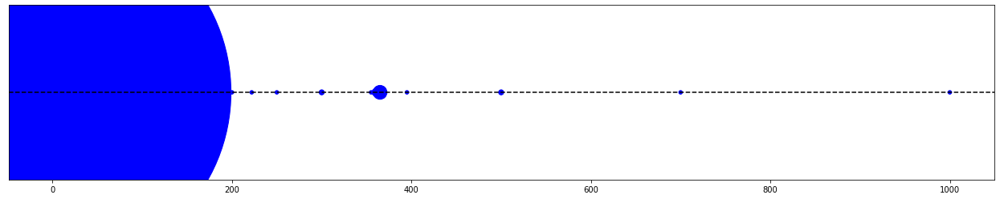

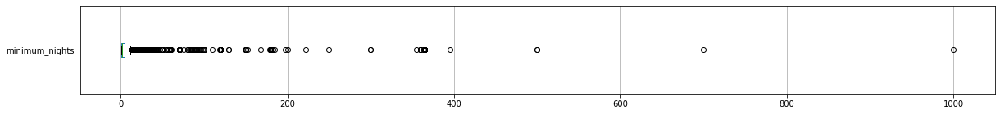

-Se detecta con Zscore > 3, valor de outliers para 'minimum_nights' a partir de:


51

In [12]:
minimum_nights = df_filtrado.iloc[:, 9]
minimum_nights_unique, counts = np.unique(minimum_nights, return_counts=True)
 
sizes = counts*20
colors = ['blue']*len(minimum_nights_unique)

plt.figure(figsize=(22,4))
plt.axhline(1, color='k', linestyle='--')
plt.scatter(minimum_nights_unique, np.ones(len(minimum_nights_unique)), s=sizes, color=colors)
plt.yticks([])
plt.show()

df.boxplot(column='minimum_nights', return_type='axes', vert=False, figsize=(20,2))
plt.show()
print("-Se detecta con Zscore > 3, valor de outliers para 'minimum_nights' a partir de:")
df_filtrado2 = df_filtrado[(np.abs(stats.zscore(df_filtrado["minimum_nights"])) < 3)]
df_filtrado2['minimum_nights'].max()

- Detección gráfica y con Zscore de outliers de `"number_of_reviews"`

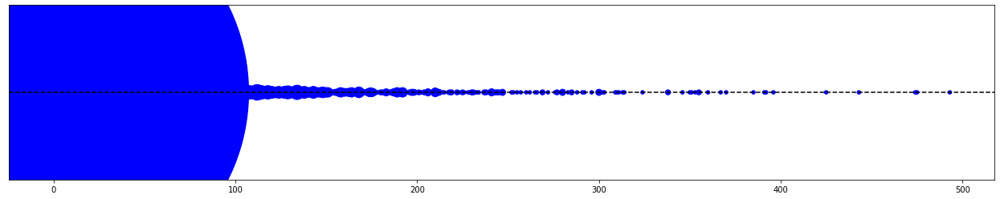

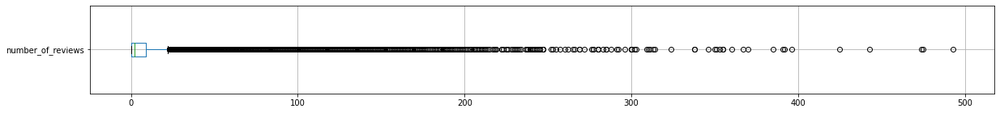

-Se detecta con Zscore > 3, valor de outliers para 'number_of_reviews' a partir de:


98

In [13]:
number_of_reviews = df_filtrado.iloc[:, 10]
number_of_reviews_unique, counts = np.unique(number_of_reviews, return_counts=True)
 
sizes = counts*20
colors = ['blue']*len(number_of_reviews_unique)

plt.figure(figsize=(22,4))
plt.axhline(1, color='k', linestyle='--')
plt.scatter(number_of_reviews_unique, np.ones(len(number_of_reviews_unique)), s=sizes, color=colors)
plt.yticks([])
plt.show()

df.boxplot(column='number_of_reviews', return_type='axes', vert=False, figsize=(20,2))
plt.show()
print("-Se detecta con Zscore > 3, valor de outliers para 'number_of_reviews' a partir de:")
df_filtrado3 = df_filtrado[(np.abs(stats.zscore(df_filtrado["number_of_reviews"])) < 3)]
df_filtrado3['number_of_reviews'].max()

- Detección gráfica y con Zscore de outliers de `"reviews_per_month"`

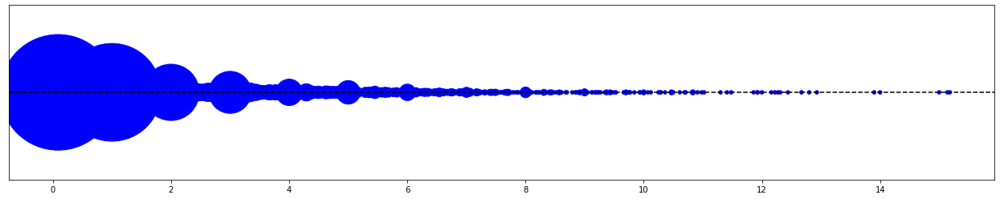

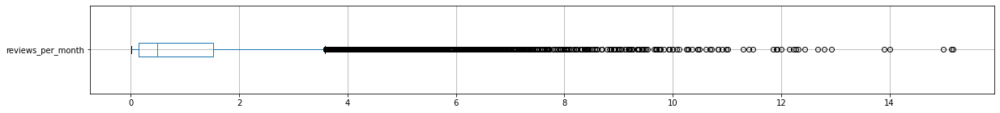

-Se detecta con Zscore > 3, valor de outliers para 'reviews_per_month' a partir de:


nan

In [14]:
reviews_per_month = df_filtrado.iloc[:, 12]
reviews_per_month_unique, counts = np.unique(reviews_per_month, return_counts=True)
 
sizes = counts*20
colors = ['blue']*len(reviews_per_month_unique)

plt.figure(figsize=(22,4))
plt.axhline(1, color='k', linestyle='--')
plt.scatter(reviews_per_month_unique, np.ones(len(reviews_per_month_unique)), s=sizes, color=colors)
plt.yticks([])
plt.show()

df.boxplot(column='reviews_per_month', return_type='axes', vert=False, figsize=(20,2))
plt.show()
print("-Se detecta con Zscore > 3, valor de outliers para 'reviews_per_month' a partir de:")
df_filtrado4 = df_filtrado[(np.abs(stats.zscore(df_filtrado["reviews_per_month"])) < 3)]
df_filtrado4['reviews_per_month'].max()

-No se puede utitlizar el Zscore porque la columna contiene gran catidad de nulos

- Detección gráfica y con Zscore de outliers de `"calculated_host_listings_count"`

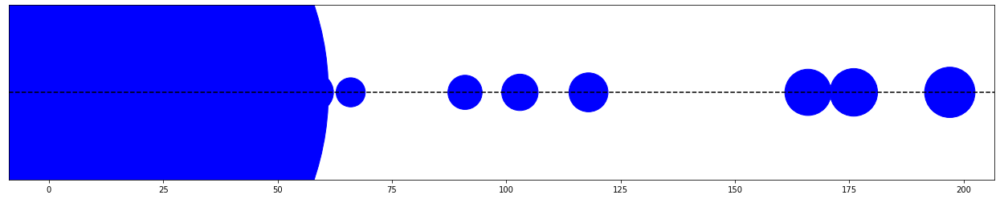

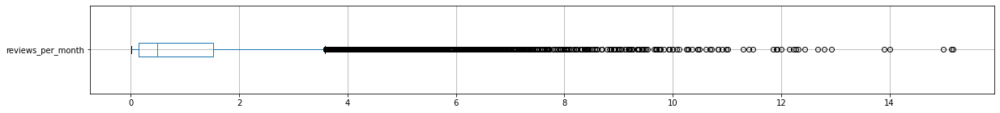

-Se detecta con Zscore > 3, valor de outliers para 'calculated_host_listings_count' a partir de:


66

In [15]:
calculated_host_listings_count = df_filtrado.iloc[:, 13]
calculated_host_listings_count_unique, counts = np.unique(calculated_host_listings_count, return_counts=True)
 
sizes = counts*20
colors = ['blue']*len(calculated_host_listings_count_unique)

plt.figure(figsize=(22,4))
plt.axhline(1, color='k', linestyle='--')
plt.scatter(calculated_host_listings_count_unique, np.ones(len(calculated_host_listings_count_unique)), s=sizes, color=colors)
plt.yticks([])
plt.show()

df.boxplot(column='reviews_per_month', return_type='axes', vert=False, figsize=(20,2))
plt.show()
print("-Se detecta con Zscore > 3, valor de outliers para 'calculated_host_listings_count' a partir de:")
df_filtrado5 = df_filtrado[(np.abs(stats.zscore(df_filtrado["calculated_host_listings_count"])) < 3)]
df_filtrado5['calculated_host_listings_count'].max()

- Detección gráfica y con Zscore de outliers de `"availability_365"`

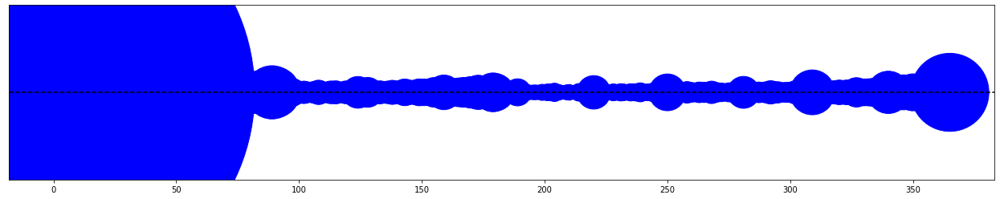

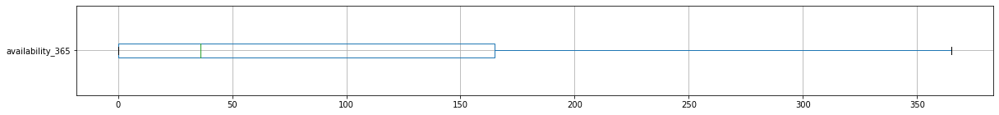

-Se detecta con Zscore > 3, valor de outliers para 'availability_365' a partir de:


365

In [16]:
availability_365 = df_filtrado.iloc[:, 14]
availability_365_unique, counts = np.unique(availability_365, return_counts=True)
 
sizes = counts*20
colors = ['blue']*len(availability_365_unique)

plt.figure(figsize=(22,4))
plt.axhline(1, color='k', linestyle='--')
plt.scatter(availability_365_unique, np.ones(len(availability_365_unique)), s=sizes, color=colors)
plt.yticks([])
plt.show()

df.boxplot(column='availability_365', return_type='axes', vert=False, figsize=(20,2))
plt.show()
print("-Se detecta con Zscore > 3, valor de outliers para 'availability_365' a partir de:")
df_filtrado5 = df_filtrado[(np.abs(stats.zscore(df_filtrado["availability_365"])) < 3)]
df_filtrado5['availability_365'].max()

#### Filtros de valores atípicos en 3 variables:

* Consenso del **rango de los valores atípicos** por cada una de las variables numéricas de nuestro interés.
* Filtros por el **rango de los valores atípicos** por variable.
* **Variables seleccionadas:**

 `minimum_nights >= 100`
 
 `calculated_host_listings_count > =75` 
 
 `price >= 1500`

### ¿ Cuántos valores de *outliers* por cada variable se van a filtrar?

* **Datos de price >=1500**

In [244]:
price_outliers=df_filtrado[df_filtrado["price"]>=1179]
price_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 434 entries, 28 to 36429
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              434 non-null    int64  
 1   name                            434 non-null    object 
 2   host_id                         434 non-null    int64  
 3   host_name                       434 non-null    object 
 4   neighbourhood                   434 non-null    object 
 5   latitude                        434 non-null    float64
 6   longitude                       434 non-null    float64
 7   room_type                       434 non-null    object 
 8   price                           434 non-null    int64  
 9   minimum_nights                  434 non-null    int64  
 10  number_of_reviews               434 non-null    int64  
 11  last_review                     148 non-null    object 
 12  reviews_per_month               1

* **Datos de *minimun_nights* >=100**

In [22]:
minimun_nights_outliers=df_filtrado[df_filtrado["minimum_nights"]>=100]
minimun_nights_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80 entries, 161 to 35711
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              80 non-null     int64  
 1   name                            80 non-null     object 
 2   host_id                         80 non-null     int64  
 3   host_name                       80 non-null     object 
 4   neighbourhood                   80 non-null     object 
 5   latitude                        80 non-null     float64
 6   longitude                       80 non-null     float64
 7   room_type                       80 non-null     object 
 8   price                           80 non-null     int64  
 9   minimum_nights                  80 non-null     int64  
 10  number_of_reviews               80 non-null     int64  
 11  last_review                     50 non-null     object 
 12  reviews_per_month               5

* **Datos de *calculated_host_listings_count* >=75**

In [246]:
host_listings_count= df_filtrado[df_filtrado["calculated_host_listings_count"]>=75]

host_listings_count.neighbourhood.value_counts()

Sydney             245
Randwick           111
Waverley           104
North Sydney       101
Mosman              68
Manly               59
Woollahra           55
Leichhardt          29
Willoughby          25
Warringah           16
Canada Bay           7
Rockdale             5
Ryde                 5
Marrickville         4
Lane Cove            4
Hunters Hill         3
Pittwater            3
Botany Bay           2
Auburn               2
The Hills Shire      1
Parramatta           1
Strathfield          1
Name: neighbourhood, dtype: int64

In [247]:
host_listings_count.neighbourhood.info()

<class 'pandas.core.series.Series'>
Int64Index: 851 entries, 879 to 36654
Series name: neighbourhood
Non-Null Count  Dtype 
--------------  ----- 
851 non-null    object
dtypes: object(1)
memory usage: 13.3+ KB


> ## 3.3. Limpieza de *Outliers*

***df_fil_noches_hc* --->** Este es el DataFrame nuevo con el filtro aplicado de valores de *outliers* detectados y definidos por el grupo para eliminar, porque no nos permiten observar patroónn. es claros del comportamies variables por su gran dispersión.

`minimum_night` >= 100 

`calculated_host_listings_coun` > =75 

`price` >= 1500**

In [110]:
df_fil_noches_hc=df_filtrado[(df_filtrado["price"]<=1500) & 
                             (df_filtrado["minimum_nights"]<=100) & 
                             (df_filtrado["calculated_host_listings_count"]<=75)]

df_fil_noches_hc.head(2)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187
1,14250,Manly Harbour House,55948,Heidi,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321


> ## 3.4. Creación de columnas:
 `last_review_year_month` 
 `last_review_year` 
 `last_review_month`
 `neighbourhood_code`
 `Host_name_and_Id`
 `estimated_ocupancy`


> * #### Creación de columna : `neighbourhood_code`

In [111]:
df_fil_noches_hc.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [112]:
df_fil_noches_hc["neighbourhood"] = df_fil_noches_hc["neighbourhood"].astype('category')
df_fil_noches_hc.dtypes

/var/folders/2z/y9k9szx937n84ztg148l8rd00000gn/T/ipykernel_775/1979993112.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fil_noches_hc["neighbourhood"] = df_fil_noches_hc["neighbourhood"].astype('category')


id                                   int64
name                                object
host_id                              int64
host_name                           object
neighbourhood                     category
latitude                           float64
longitude                          float64
room_type                           object
price                                int64
minimum_nights                       int64
number_of_reviews                    int64
last_review                         object
reviews_per_month                  float64
calculated_host_listings_count       int64
availability_365                     int64
dtype: object

In [113]:
df_fil_noches_hc["neighbourhood_code"] = df_fil_noches_hc["neighbourhood"].cat.codes
df_fil_noches_hc.head(1)

/var/folders/2z/y9k9szx937n84ztg148l8rd00000gn/T/ipykernel_775/2615677079.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fil_noches_hc["neighbourhood_code"] = df_fil_noches_hc["neighbourhood"].cat.codes


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187,32


In [114]:
df_fil_noches_hc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35473 entries, 0 to 36661
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              35473 non-null  int64   
 1   name                            35461 non-null  object  
 2   host_id                         35473 non-null  int64   
 3   host_name                       35467 non-null  object  
 4   neighbourhood                   35473 non-null  category
 5   latitude                        35473 non-null  float64 
 6   longitude                       35473 non-null  float64 
 7   room_type                       35473 non-null  object  
 8   price                           35473 non-null  int64   
 9   minimum_nights                  35473 non-null  int64   
 10  number_of_reviews               35473 non-null  int64   
 11  last_review                     24065 non-null  object  
 12  reviews_per_month 

In [39]:
print(df_fil_noches_hc[['neighbourhood_code','neighbourhood']])

       neighbourhood_code neighbourhood
0                      32        Sydney
1                      20         Manly
2                      32        Sydney
3                      18    Leichhardt
4                      37     Woollahra
...                   ...           ...
36657                  37     Woollahra
36658                   8    Canada Bay
36659                  30   Strathfield
36660                  28      Rockdale
36661                  32        Sydney

[35473 rows x 2 columns]


In [42]:
nh_code_name = df_fil_noches_hc.drop_duplicates(["neighbourhood_code"])
nh_code_name[["neighbourhood", "neighbourhood_code"]].sort_values(["neighbourhood_code"],
              ascending = [True])

,neighbourhood,neighbourhood_code
130,Ashfield,0
104,Auburn,1
2098,Bankstown,2
68,Blacktown,3
272,Botany Bay,4
517,Burwood,5
1361,Camden,6
612,Campbelltown,7
118,Canada Bay,8
56,Canterbury,9


* **Creación de columna nueva uniendo `host_name` & `host_id`**

In [115]:
df_fil_noches_hc["Host_name_and_Id"] = df_fil_noches_hc.agg('{0[host_name]}, Id:{0[host_id]}'.format, axis=1)
df_fil_noches_hc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35473 entries, 0 to 36661
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              35473 non-null  int64   
 1   name                            35461 non-null  object  
 2   host_id                         35473 non-null  int64   
 3   host_name                       35467 non-null  object  
 4   neighbourhood                   35473 non-null  category
 5   latitude                        35473 non-null  float64 
 6   longitude                       35473 non-null  float64 
 7   room_type                       35473 non-null  object  
 8   price                           35473 non-null  int64   
 9   minimum_nights                  35473 non-null  int64   
 10  number_of_reviews               35473 non-null  int64   
 11  last_review                     24065 non-null  object  
 12  reviews_per_month 

/var/folders/2z/y9k9szx937n84ztg148l8rd00000gn/T/ipykernel_775/886524399.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fil_noches_hc["Host_name_and_Id"] = df_fil_noches_hc.agg('{0[host_name]}, Id:{0[host_id]}'.format, axis=1)


* **Creacion de la columna `"estimated_occupancy"`**

**occupancy** = ((`reviews_per_month` * `minnimum_night`) * 12) / `availability_365`)

* Necesitamos un DF con `number_of_reviews´ > 0 para que nos de una ocupancia esperada.
* No se puede multiplicar ni dividir `reviews_per_month`de valor 0.
* Necesitamos un DF con ´reviews_per_month´ que no tenga nulos.

In [116]:
#'number_of_reviews' > 0
df_number_of_reviews_pos = df_fil_noches_hc[df_fil_noches_hc['reviews_per_month'] > 0]
df_number_of_reviews_pos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24065 entries, 0 to 36494
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              24065 non-null  int64   
 1   name                            24060 non-null  object  
 2   host_id                         24065 non-null  int64   
 3   host_name                       24063 non-null  object  
 4   neighbourhood                   24065 non-null  category
 5   latitude                        24065 non-null  float64 
 6   longitude                       24065 non-null  float64 
 7   room_type                       24065 non-null  object  
 8   price                           24065 non-null  int64   
 9   minimum_nights                  24065 non-null  int64   
 10  number_of_reviews               24065 non-null  int64   
 11  last_review                     24065 non-null  object  
 12  reviews_per_month 

## Duda: antes de hacer la ocupancia tengo que solucionar los valores nulos y los ceros de number of reviews y de reviews_per_month?

* ### La ocupancia se determinó solo para inmuebles con:`numbers_of_reviews` >0 ---> 24186

-Vemos que el nuevo DataFrame nos elimina cerca de 12342 entradas con `number_of_reviews` == 0

In [106]:
df_reviews_per_month_filled['estimated_occupancy_on_year'] = df_reviews_per_month_filled['reviews_per_month'] * df_reviews_per_month_filled['minimum_nights'] * 12 / df_reviews_per_month_filled['availability_365']
df_reviews_per_month_filled.head(2)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,Host_name_and_Id,estimated_occupancy_on_year
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187,32,"Stuart, Id:17061",0.619893
1,14250,Manly Harbour House,55948,Heidi,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321,20,"Heidi, Id:55948",0.005607


In [79]:
df_number_of_reviews_pos['estimated_occupancy_on_year'] = ((df_number_of_reviews_pos['reviews_per_month'] 
                                                           * df_number_of_reviews_pos['minimum_nights']) * 12
                                                           / (df_number_of_reviews_pos['availability_365']))
df_number_of_reviews_pos.head(2)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,Host_name_and_Id,last_review_date,last_review_year_month,last_review_year,last_review_month,estimated_occupancy_on_year
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,...,4.83,2,187,32,"Stuart, Id:17061",2018-11-21,2018-11,2018,11,0.619893
1,14250,Manly Harbour House,55948,Heidi,Manly,-33.800929,151.261722,Entire home/apt,471,5,...,0.03,2,321,20,"Heidi, Id:55948",2016-01-02,2016-01,2016,01,0.005607


In [84]:
df_number_of_reviews_pos.estimated_occupancy_on_year.describe()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


count    3.547300e+04
mean              inf
std               NaN
min      3.571429e-04
25%      1.200162e-01
50%      7.714286e-01
75%               NaN
max               inf
Name: estimated_occupancy_on_year, dtype: float64

* ### No entiendo que hice exactamente aqui arriba...

> ## 3.5. Modificación / Transformación de variables (columnas & filas)

* ###  `last_review` *nulos* & `number_of_reviews`==0 

#### Reemplazamos los `last_review` *nulos* que tienen `number_of_reviews`==0 por la categoría "Nunca"

In [121]:
df_fil_noches_hc = df_fil_noches_hc.fillna({'reviews_per_month': 0, 'last_review': "Nunca"})
df_fil_noches_hc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35473 entries, 0 to 36661
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              35473 non-null  int64   
 1   name                            35461 non-null  object  
 2   host_id                         35473 non-null  int64   
 3   host_name                       35467 non-null  object  
 4   neighbourhood                   35473 non-null  category
 5   latitude                        35473 non-null  float64 
 6   longitude                       35473 non-null  float64 
 7   room_type                       35473 non-null  object  
 8   price                           35473 non-null  int64   
 9   minimum_nights                  35473 non-null  int64   
 10  number_of_reviews               35473 non-null  int64   
 11  last_review                     35473 non-null  object  
 12  reviews_per_month 

In [122]:
df_fil_noches_hc.isnull().sum()

id                                 0
name                              12
host_id                            0
host_name                          6
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
neighbourhood_code                 0
Host_name_and_Id                   0
dtype: int64

* ###  `reviews_per_month` ==0 & `number_of_reviews` => 1 

In [123]:
vercosas = df_fil_noches_hc[(df_fil_noches_hc['reviews_per_month'] == 0 ) & (df_fil_noches_hc['number_of_reviews'] >= 1) ]
vercosas.number_of_reviews.value_counts()

1    115
2      4
4      1
3      1
Name: number_of_reviews, dtype: int64

* Tenemos que hay 121 valores de cero `reviews_per_month` que tienen `number_of_reviews` => 1Tenemos que hay 121 valores de cero `reviews_per_month` que tienen `number_of_reviews` => 1

* ¿Cómo reemplazo estos 121 valores por la media de `reviews_per_month` que tienen `number_of_reviews` => 1

In [124]:
#Calculo la media o el valor con el cual voy a reemplazar
reviews = df_fil_noches_hc[(df_fil_noches_hc['number_of_reviews'] == 1) ]
reviews.reviews_per_month.mean()

0.2467078825347759

* ## No se porque ésta media es diferente a la que observamos en el `.describe`

In [123]:
vercosas = df_fil_noches_hc[(df_fil_noches_hc['number_of_reviews'] == 1) ]
vercosas.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code
count,5.176000e+03,5.176000e+03,5176.000000,5176.000000,5176.000000,5176.000000,5176.0,5061.000000,5176.000000,5176.000000,5176.000000
mean,1.908135e+07,6.941160e+07,-33.865342,151.208387,185.676198,4.569938,1.0,0.252314,3.013331,70.721986,27.144513
std,8.020439e+06,6.423887e+07,0.068556,0.080436,186.570339,6.621538,0.0,0.337171,7.589315,116.176215,9.051051
min,1.425000e+04,4.400200e+04,-34.088289,150.655200,0.000000,1.000000,1.0,0.010000,1.000000,0.000000,0.000000
25%,1.224929e+07,1.817328e+07,-33.901020,151.181748,71.000000,2.000000,1.0,0.040000,1.000000,0.000000,22.000000
50%,2.138793e+07,4.675374e+07,-33.885430,151.222512,120.000000,3.000000,1.0,0.090000,1.000000,0.000000,32.000000
75%,2.533694e+07,1.090567e+08,-33.834584,151.264097,220.000000,5.000000,1.0,0.280000,2.000000,87.000000,34.000000
max,3.056626e+07,2.292135e+08,-33.400383,151.339553,1495.000000,100.000000,1.0,1.000000,66.000000,365.000000,37.000000


In [125]:
# Hacemos el reemplazo cumpliendo las 2 condiciones:
df_fil_noches_hc['reviews_per_month'] = np.where((df_fil_noches_hc['reviews_per_month'] == 0) & 
                                                 (df_fil_noches_hc['number_of_reviews'] >= 1), 0.24670, 
                                                 df_fil_noches_hc['reviews_per_month'])


In [127]:
df_fil_noches_hc.isnull().sum()

id                                 0
name                              12
host_id                            0
host_name                          6
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
neighbourhood_code                 0
Host_name_and_Id                   0
dtype: int64

In [126]:
#Corroboramos que ya no hay estos valores de 0 en 'reviews_per_month'
vercosas1 = df_fil_noches_hc[(df_fil_noches_hc['reviews_per_month'] == 0 ) & (df_fil_noches_hc['number_of_reviews'] >= 1) ]
vercosas1.number_of_reviews.value_counts()

Series([], Name: number_of_reviews, dtype: int64)

In [156]:
df_fil_noches_hc.last_review.value_counts()

2018-12-01    712
2018-11-24    532
2018-12-02    526
2018-11-17    455
2018-11-22    421
             ... 
2015-09-11      1
2015-05-17      1
2015-07-18      1
2014-07-12      1
2017-08-24      1
Name: last_review, Length: 1400, dtype: int64

In [62]:
df_fil_noches_hc.sort_values(["last_review"], ascending = [False])

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,Host_name_and_Id,last_review_date,last_review_year_month,last_review_year,last_review_month
36661,30593866,Huge Sunny Double Room with Spa in Best Location,51138070,Aaron & Natalie,Sydney,-33.906938,151.211255,Private room,80,5,...,Nunca,0.00,3,11,32,"Aaron & Natalie, Id:51138070",NaT,NaN,NaN,NaN
10117,12995227,A private room in a Nepali family home,71616854,Heera,Blacktown,-33.734526,150.936483,Private room,60,2,...,Nunca,0.00,1,362,3,"Heera, Id:71616854",NaT,NaN,NaN,NaN
28168,25983357,Bright Sydenham Room,60001299,Blake,Marrickville,-33.918849,151.165474,Private room,42,1,...,Nunca,0.00,1,0,21,"Blake, Id:60001299",NaT,NaN,NaN,NaN
28163,25980788,Our house really pretty cool. Close to 4 beach’s,194408313,Yusuf,Waverley,-33.906931,151.258344,Private room,55,24,...,Nunca,0.00,1,179,35,"Yusuf, Id:194408313",NaT,NaN,NaN,NaN
10101,12974315,Beautiful Coogee Beach 3 mins away!!,71409139,Les,Randwick,-33.923003,151.255547,Private room,46,2,...,Nunca,0.00,1,0,27,"Les, Id:71409139",NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,806161,Sydney North Suburb Sunny rooms 1,4243753,Sophie,Ryde,-33.768859,151.106030,Private room,40,2,...,2012-12-31,0.03,3,28,29,"Sophie, Id:4243753",2012-12-31,2012-12,2012,12
226,614739,"Big, bright room in Stanmore house",3048738,Elise,Marrickville,-33.890147,151.168151,Private room,46,14,...,2012-10-31,0.03,1,0,21,"Elise, Id:3048738",2012-10-31,2012-10,2012,10
44,118658,Luxury apartment by the beach,599232,James,Waverley,-33.891235,151.285471,Entire home/apt,226,60,...,2012-04-15,0.06,1,90,35,"James, Id:599232",2012-04-15,2012-04,2012,04
34,80470,Brand newly renovated 2Bed2Bath,434914,James,North Sydney,-33.829992,151.218311,Entire home/apt,400,6,...,2012-01-06,0.06,1,364,23,"James, Id:434914",2012-01-06,2012-01,2012,01


> * #### Creación de columna : 
`last_review_year_month` 
`last_review_year` 
`last_review_month`

* Transformación de: `last_review` a tipo de datos *date*

In [128]:
df_fil_noches_hc['last_review_date'] = pd.to_datetime(df_fil_noches_hc['last_review'], format="%Y-%m-%d")

ValueError: time data Nunca doesn't match format specified

In [49]:
df_fil_noches_hc['last_review_year_month'] = df_fil_noches_hc['last_review_date'].dt.strftime('%Y-%m')

In [50]:
df_fil_noches_hc['last_review_year'] = df_fil_noches_hc['last_review_date'].dt.strftime('%Y')

In [53]:
df_fil_noches_hc['last_review_month'] = df_fil_noches_hc['last_review_date'].dt.strftime('%m')
df_fil_noches_hc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35473 entries, 0 to 36661
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              35473 non-null  int64         
 1   name                            35461 non-null  object        
 2   host_id                         35473 non-null  int64         
 3   host_name                       35467 non-null  object        
 4   neighbourhood                   35473 non-null  category      
 5   latitude                        35473 non-null  float64       
 6   longitude                       35473 non-null  float64       
 7   room_type                       35473 non-null  object        
 8   price                           35473 non-null  int64         
 9   minimum_nights                  35473 non-null  int64         
 10  number_of_reviews               35473 non-null  int64         
 11  la

> ## 3.6. Cluster por variable Precio

* Identificación de # de grupos idóneos de acuerdo a la dispersión de los datos (# de clústers)

In [136]:
numericas

['latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365',
 'log_price']

In [167]:
X = df_fil_noches_hc[['reviews_per_month','price']].values
y = df_fil_noches_hc['minimum_nights'].values
 
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [168]:
#Creamos el clasificador con un n_grupos definido a priori los cuales despues se ajustaran

In [193]:
n_neighbors = 15
 
knn = KNeighborsClassifier(n_neighbors)
knn.fit(X_train, y_train)
print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(X_test, y_test)))

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Accuracy of K-NN classifier on training set: 0.37


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Accuracy of K-NN classifier on test set: 0.32


## Vemos que la precisión que nos da es de 37% en el set de entrenamiento y del 32% para el de test.

## Confusión Matrix y el Reporte sobre el conjunto de test, que nos detalla los aciertos y fallos:

In [172]:
pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


[[1356  679  230 ...    0    0    0]
 [1002  851  234 ...    0    0    0]
 [ 466  426  183 ...    0    0    0]
 ...
 [  10    5    5 ...    0    0    0]
 [   0    1    1 ...    0    0    0]
 [   2    0    0 ...    0    0    0]]
              precision    recall  f1-score   support

           1       0.35      0.55      0.43      2446
           2       0.31      0.38      0.34      2265
           3       0.17      0.15      0.16      1250
           4       0.08      0.03      0.04       507
           5       0.14      0.08      0.10       767
           6       0.00      0.00      0.00       127
           7       0.20      0.13      0.16       819
           8       0.00      0.00      0.00        34
           9       0.00      0.00      0.00        18
          10       0.00      0.00      0.00       131
          11       0.00      0.00      0.00         3
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00         6
          14   

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

## Cómo se ve la puntuación F1 es del 29%, es muy baja, se relaciona con la baja correlación de las variables numéricas.

## Gráfica con la clasificación obtenida, la que nos ayuda a ver fácilmente en donde caerán las predicciones.

In [175]:
h = .02  # step size in the mesh
 
# Create color maps
cmap_light = ListedColormap(['#FFAAAA', '#ffcc99', '#ffffb3','#b3ffff','#c2f0c2'])
cmap_bold = ListedColormap(['#FF0000', '#ff9933','#FFFF00','#00ffff','#00FF00'])
 
# we create an instance of Neighbours Classifier and fit the data.
clf = KNeighborsClassifier(n_neighbors, weights='distance')
clf.fit(X, y)
 
# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
 
# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure()
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)
 
# Plot also the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold,
                edgecolor='k', s=20)
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
    
patch0 = mpatches.Patch(color='#FF0000', label='1')
patch1 = mpatches.Patch(color='#ff9933', label='2')
patch2 = mpatches.Patch(color='#FFFF00', label='3')
patch3 = mpatches.Patch(color='#00ffff', label='4')
patch4 = mpatches.Patch(color='#00FF00', label='5')
plt.legend(handles=[patch0, patch1, patch2, patch3,patch4])
 
    
plt.title("5-Class classification (k = %i, weights = '%s')"
              % (n_neighbors, weights))
 
plt.show()

KeyboardInterrupt: 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will 

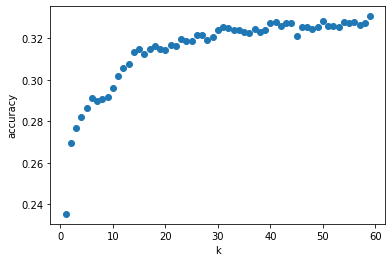

In [195]:
k_range = range(1, 30)
scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_train, y_train)
    scores.append(knn.score(X_test, y_test))
plt.figure()
plt.xlabel('k')
plt.ylabel('accuracy')
plt.scatter(k_range, scores)
#plt.xticks([0,5,10,15,20])

Otra forma de cluster con Kmeans:

In [202]:
# Escalado de datos
# ==============================================================================
X_scaled = scale(df_fil_noches_hc['price'])

In [203]:
# Modelo
# ==============================================================================
X_scaled = scale(X)
modelo_kmeans = KMeans(n_clusters=8, n_init=25, random_state=123)
modelo_kmeans.fit(X=X_scaled)

KMeans(n_init=25, random_state=123)

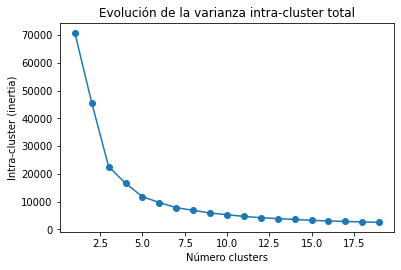

In [213]:
# Método elbow para identificar el número óptimo de clusters
# ==============================================================================
range_n_clusters = range(1, 20)
inertias = []

for n_clusters in range_n_clusters:
    modelo_kmeans = KMeans(
                        n_clusters   = n_clusters, 
                        n_init       = 20, 
                        random_state = 123
                    )
    modelo_kmeans.fit(X_scaled)
    inertias.append(modelo_kmeans.inertia_)

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_n_clusters, inertias, marker='o')
ax.set_title("Evolución de la varianza intra-cluster total")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Intra-cluster (inertia)');

In [206]:
# Método silhouette para identificar el número óptimo de clusters
# ==============================================================================
range_n_clusters = range(2, 15)
valores_medios_silhouette = []

for n_clusters in range_n_clusters:
    modelo_kmeans = KMeans(
                        n_clusters   = n_clusters, 
                        n_init       = 20, 
                        random_state = 123
                    )
    cluster_labels = modelo_kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    valores_medios_silhouette.append(silhouette_avg)
    
fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_n_clusters, valores_medios_silhouette, marker='o')
ax.set_title("Evolución de media de los índices silhouette")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Media índices silhouette');

KeyboardInterrupt: 

In [207]:
# Clasificación con el modelo kmeans
# ==============================================================================
y_predict = modelo_kmeans.predict(X=X_scaled)

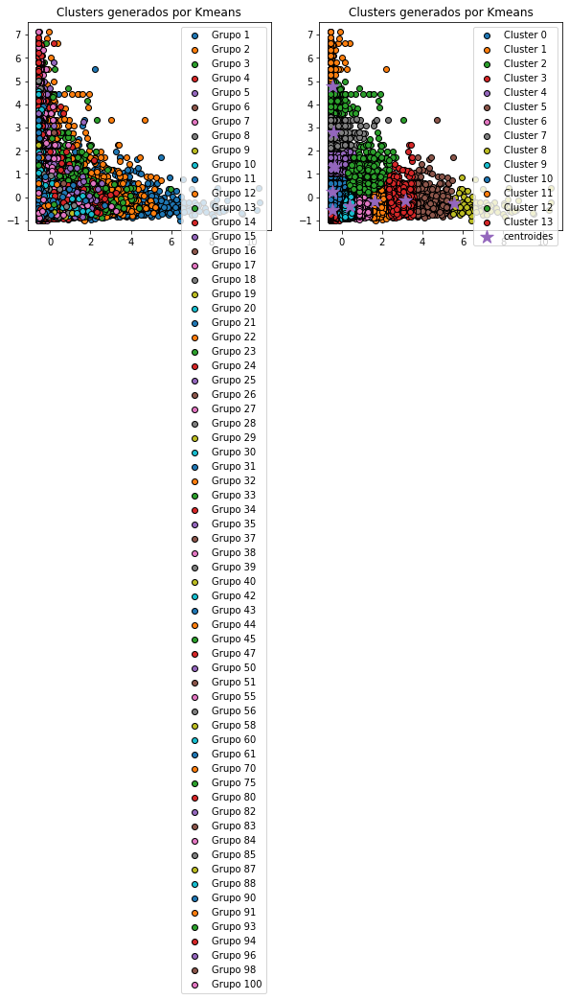

In [212]:
# Representación gráfica: grupos originales vs clusters creados
# ==============================================================================
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Grupos originales
for i in np.unique(y):
    ax[0].scatter(
        x = X_scaled[y == i, 0],
        y = X_scaled[y == i, 1], 
        #c = plt.rcParams['axes.prop_cycle'].by_key()['color'][i],
        marker    = 'o',
        edgecolor = 'black', 
        label= f"Grupo {i}"
    )
    
ax[0].set_title('Clusters generados por Kmeans')
ax[0].legend();

for i in np.unique(y_predict):
    ax[1].scatter(
        x = X_scaled[y_predict == i, 0],
        y = X_scaled[y_predict == i, 1], 
        #c = plt.rcParams['axes.prop_cycle'].by_key()['color'][i],
        marker    = 'o',
        edgecolor = 'black', 
        label= f"Cluster {i}"
    )
    
ax[1].scatter(
    x = modelo_kmeans.cluster_centers_[:, 0],
    y = modelo_kmeans.cluster_centers_[:, 1], 
    #c = 'black',
    s = 200,
    marker = '*',
    label  = 'centroides'
)
ax[1].set_title('Clusters generados por Kmeans')
ax[1].legend();

In [209]:
# Matriz de confusión: grupos originales vs clusters creados
# ==============================================================================
pd.crosstab(y, y_predict, dropna=False, rownames=['grupo_real'], colnames=['cluster'])

cluster,0,1,2,3,4,5,6,7,8
grupo_real,,,,,,,,,
1,4405,1105,81,1771,1071,218,37,294,768
2,3139,1156,172,1852,1533,25,95,588,384
3,2088,299,110,753,1236,3,61,447,56
4,842,73,90,208,609,0,44,270,12
5,1234,36,194,191,859,0,115,464,2
...,...,...,...,...,...,...,...,...,...
93,0,0,0,1,0,0,0,0,0
94,1,0,0,0,0,0,0,0,0
96,0,0,0,0,1,0,0,0,0


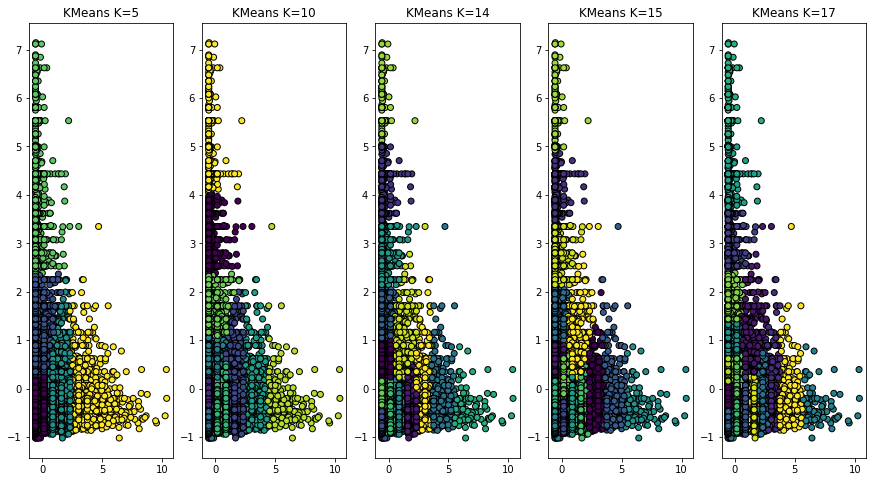

In [220]:
fig, ax = plt.subplots(1, 5, figsize=(15, 8))

# Resultados para K = 5
# ==============================================================================
y_predict = KMeans(n_clusters=5, n_init=25, random_state=123).fit_predict(X=X_scaled)
ax[0].scatter(
        x = X_scaled[:, 0],
        y = X_scaled[:, 1], 
        c = y_predict,
        #cmap='viridis',
        marker    = 'o',
        edgecolor = 'black'
    )
ax[0].set_title('KMeans K=5');

# Resultados para K = 10
# ==============================================================================
y_predict = KMeans(n_clusters=10, n_init=25, random_state=123).fit_predict(X=X_scaled)
ax[1].scatter(
        x = X_scaled[:, 0],
        y = X_scaled[:, 1], 
        c = y_predict,
        #cmap='viridis',
        marker    = 'o',
        edgecolor = 'black'
    )
ax[1].set_title('KMeans K=10');

# Resultados para K = 14
# ==============================================================================
y_predict = KMeans(n_clusters=14, n_init=25, random_state=123).fit_predict(X=X_scaled)
ax[2].scatter(
        x = X_scaled[:, 0],
        y = X_scaled[:, 1], 
        c = y_predict,
        #cmap='viridis',
        marker    = 'o',
        edgecolor = 'black'
    )
ax[2].set_title('KMeans K=14');

# Resultados para K = 15
# ==============================================================================
y_predict = KMeans(n_clusters=15, n_init=25, random_state=123).fit_predict(X=X_scaled)
ax[3].scatter(
        x = X_scaled[:, 0],
        y = X_scaled[:, 1], 
        c = y_predict,
        #cmap='viridis',
        marker    = 'o',
        edgecolor = 'black'
    )
ax[3].set_title('KMeans K=15');

# Resultados para K = 17
# ==============================================================================
y_predict = KMeans(n_clusters=17, n_init=25, random_state=123).fit_predict(X=X_scaled)
ax[4].scatter(
        x = X_scaled[:, 0],
        y = X_scaled[:, 1], 
        c = y_predict,
        #cmap='viridis',
        marker    = 'o',
        edgecolor = 'black'
    )
ax[4].set_title('KMeans K=17');

## En conclusión respecto a los clusters por precio (creemos que no lo estamos haciendo bien porque el accuracy es muy bajo, y porque no entendemos los grupos que se forman):

* Se puede formar supuestamente entre 10 y 17 grupos respecto al precio.
* ¿Cómo clasificar los inmuebles por grupos de acuerdo al precio y barrios (ubicación geografica)
* ¿Cómo incluir barrio como variable en el cluster, si es categorica?
* Creamos una columna de codigo de barrio para usarla como variable numerica, puede ser util?

# ----------------------------------------------------------------------------------------------

# 4. Distribución de datos

> #### Distribución gráfica de datos:

Se realiza la descripción visual o gráfica de la distribución de datos de las variables de la base de datos.

Utilizamos 3 aproximaciones gráficas básicas para *evaluar* el tipo de distribución de datos de variables observadas:
 * **Histogramas o barras de distribución** de datos.
 * **Gráficos de densidad** para distribución de datos
 * **Q-Q Plots**

> ### 4.1. Barras de distribución (`sns.distplot`) + Gráficos de densidad (`kde`)

#### Argumentos importantes de este gráfico de distribución:
**Rug plot**---->muestra marcas a lo largo de un eje. Se utiliza para visualizar la distribución de los datos.

**Bins**---->número de rangos en eje X

**kde**---->Calcula la estimación de la densidad del kernel

In [173]:
numericas

['latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level functio

<function matplotlib.pyplot.show(close=None, block=None)>

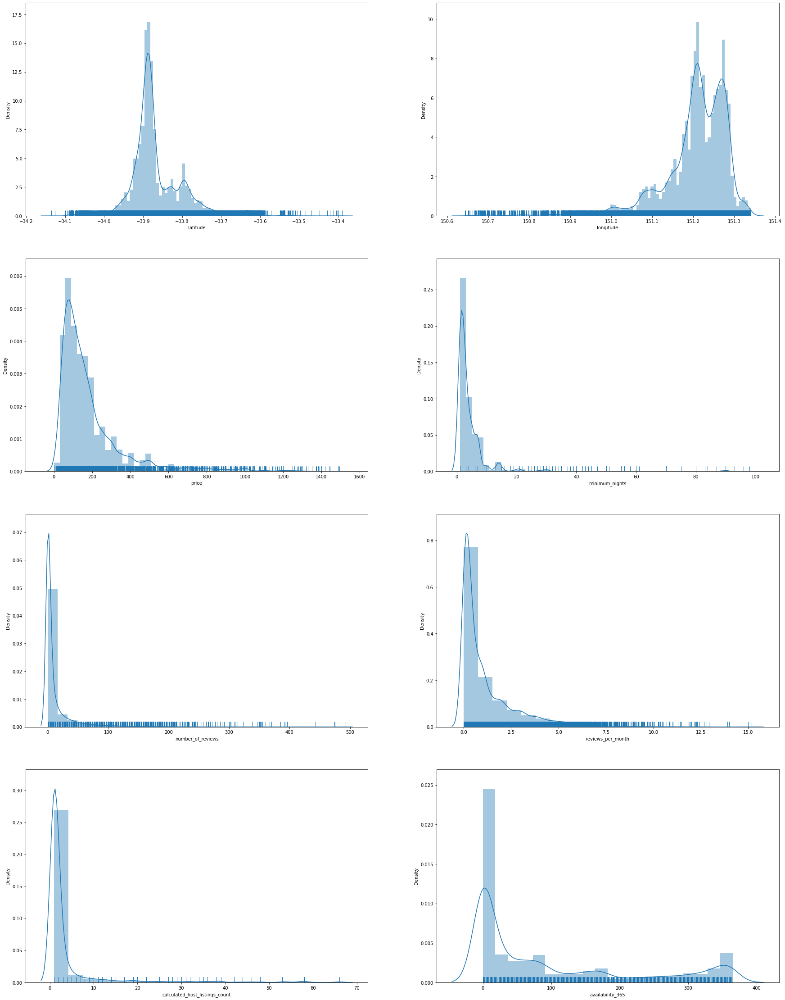

In [198]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(30, 40))

plt.subplot(4,2,1)
sns.distplot(df_fil_noches_hc['latitude'], kde = True, bins=100, rug = True)
plt.ylim()

plt.subplot(4,2,2)
sns.distplot(df_fil_noches_hc['longitude'], kde = True, bins=100, rug = True)
plt.ylim()

plt.subplot(4,2,3)
sns.distplot(df_fil_noches_hc['price'], kde = True, bins=50, rug = True)
plt.ylim()

plt.subplot(4,2,4)
sns.distplot(df_fil_noches_hc['minimum_nights'], kde = True, bins=50, rug = True)
plt.ylim()

plt.subplot(4,2,5)
sns.distplot(df_fil_noches_hc['number_of_reviews'], kde = True, bins=30, rug = True)
plt.ylim()

plt.subplot(4,2,6)
sns.distplot(df_fil_noches_hc['reviews_per_month'], kde = True, bins=20, rug = True)
plt.ylim()

plt.subplot(4,2,7)
sns.distplot(df_fil_noches_hc['calculated_host_listings_count'], kde = True, bins=20, rug = True)
plt.ylim()

plt.subplot(4,2,8)
sns.distplot(df_fil_noches_hc['availability_365'], kde = True, bins=20, rug = True)
plt.ylim()

plt.show


> ### 4.2. Q-Q Plots (`qq.plot`) 

**Q-Q (quantile-quantile)** es un gráfico de probabilidad, que es un método gráfico para comparar dos distribuciones de probabilidad al trazar sus cuantiles uno contra el otro.

**Distribución Normal** ---->Lo ideal es que los puntos se acerquen a una recta diagonal.

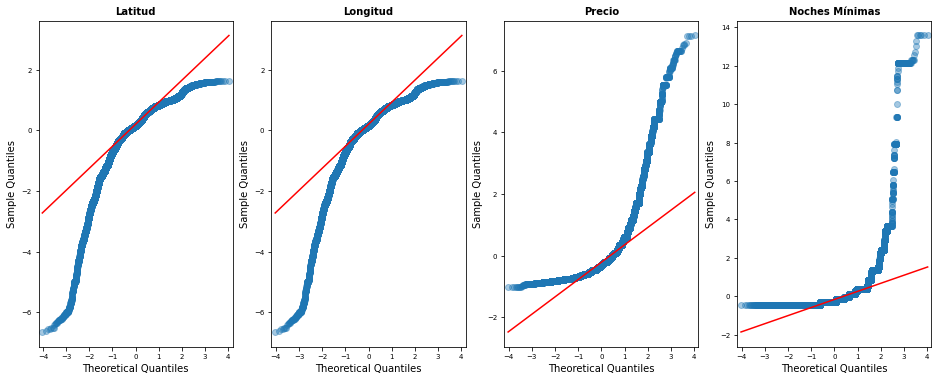

In [266]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 6))

sm.qqplot(
    df_fil_noches_hc.longitude,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[0]
)
axs[0].set_title('Latitud', fontsize = 10, fontweight = "bold")
axs[0].tick_params(labelsize = 7)

sm.qqplot(
    df_fil_noches_hc.longitude,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[1]
)
axs[1].set_title('Longitud', fontsize = 10, fontweight = "bold")
axs[1].tick_params(labelsize = 7)

sm.qqplot(
    df_fil_noches_hc.price,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[2]
)
axs[2].set_title('Precio', fontsize = 10, fontweight = "bold")
axs[2].tick_params(labelsize = 7)

sm.qqplot(
    df_fil_noches_hc.minimum_nights,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[3]
)
axs[3].set_title('Noches Mínimas', fontsize = 10, fontweight = "bold")
axs[3].tick_params(labelsize = 7)

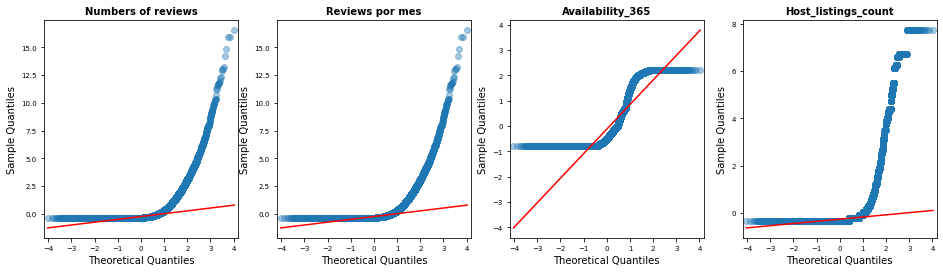

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

sm.qqplot(
    df_fil_noches_hc.number_of_reviews,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[0]
)
axs[0].set_title('Numbers of reviews', fontsize = 10, fontweight = "bold")
axs[0].tick_params(labelsize = 7)

sm.qqplot(
    df_fil_noches_hc.number_of_reviews,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[1]
)
axs[1].set_title('Reviews por mes', fontsize = 10, fontweight = "bold")
axs[1].tick_params(labelsize = 7)

sm.qqplot(
    df_fil_noches_hc.availability_365,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[2]
)
axs[2].set_title('Availability_365', fontsize = 10, fontweight = "bold")
axs[2].tick_params(labelsize = 7)

sm.qqplot(
    df_fil_noches_hc.calculated_host_listings_count,
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[3]
)
axs[3].set_title('Host_listings_count', fontsize = 10, fontweight = "bold")
axs[3].tick_params(labelsize = 7)


In [217]:
numericas

['latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

> ### 4.3. Prueba de Normalidad Shapiro-Wilk test  (`stats.shapiro`) 

In [218]:
# Normalidad de los residuos Shapiro-Wilk test
# ==============================================================================
shapiro_test = stats.shapiro(df_fil_noches_hc.latitude)
print(f"Variable latitude: {shapiro_test}")
shapiro_test = stats.shapiro(df_fil_noches_hc.longitude)
print(f"Variable longitude: {shapiro_test}")
shapiro_test = stats.shapiro(df_fil_noches_hc.price)
print(f"Variable price: {shapiro_test}")
shapiro_test = stats.shapiro(df_fil_noches_hc.minimum_nights)
print(f"Variable minimum_nights: {shapiro_test}")
shapiro_test = stats.shapiro(df_fil_noches_hc.number_of_reviews)
print(f"Variable number_of_reviews: {shapiro_test}")
shapiro_test = stats.shapiro(df_fil_noches_hc.calculated_host_listings_count)
print(f"Variable calculated_host_listings_count: {shapiro_test}")
shapiro_test = stats.shapiro(df_fil_noches_hc.availability_365)
print(f"Variable availability_365: {shapiro_test}")

Variable latitude: ShapiroResult(statistic=0.8854122161865234, pvalue=0.0)
Variable longitude: ShapiroResult(statistic=0.8394477367401123, pvalue=0.0)
Variable price: ShapiroResult(statistic=0.7010080218315125, pvalue=0.0)
Variable minimum_nights: ShapiroResult(statistic=0.38234084844589233, pvalue=0.0)
Variable number_of_reviews: ShapiroResult(statistic=0.46346598863601685, pvalue=0.0)
Variable calculated_host_listings_count: ShapiroResult(statistic=0.3527429699897766, pvalue=0.0)
Variable availability_365: ShapiroResult(statistic=0.760971188545227, pvalue=0.0)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


* **Si el *p-valor* es muy bajo, deberíamos rechazar la hipótesis nula. Es decir, la distribución no es normal.**
* "p-value may not be accurate for N > 5000."

> ### 4.4. Prueba de Normalidad de los residuos D'Agostino's K-squared test  (`stats.normaltest`) 

In [220]:
# Normalidad de los residuos D'Agostino's K-squared test
# ==============================================================================
shapiro_test = stats.normaltest(df_fil_noches_hc.latitude)
print(f"Variable latitude: {shapiro_test}")
shapiro_test = stats.normaltest(df_fil_noches_hc.longitude)
print(f"Variable longitude: {shapiro_test}")
shapiro_test = stats.normaltest(df_fil_noches_hc.price)
print(f"Variable price: {shapiro_test}")
shapiro_test = stats.normaltest(df_fil_noches_hc.minimum_nights)
print(f"Variable minimum_nights: {shapiro_test}")
shapiro_test = stats.normaltest(df_fil_noches_hc.number_of_reviews)
print(f"Variable number_of_reviews: {shapiro_test}")
shapiro_test = stats.normaltest(df_fil_noches_hc.calculated_host_listings_count)
print(f"Variable calculated_host_listings_count: {shapiro_test}")
shapiro_test = stats.normaltest(df_fil_noches_hc.availability_365)
print(f"Variable availability_365: {shapiro_test}")

Variable latitude: NormaltestResult(statistic=8340.006230650937, pvalue=0.0)
Variable longitude: NormaltestResult(statistic=15737.254863144653, pvalue=0.0)
Variable price: NormaltestResult(statistic=20961.42214543025, pvalue=0.0)
Variable minimum_nights: NormaltestResult(statistic=48175.64418316939, pvalue=0.0)
Variable number_of_reviews: NormaltestResult(statistic=35375.76792146952, pvalue=0.0)
Variable calculated_host_listings_count: NormaltestResult(statistic=33235.28991510051, pvalue=0.0)
Variable availability_365: NormaltestResult(statistic=5070.509202407376, pvalue=0.0)


#### Estos datos no son normales!!!!

#### ¿Qué hacemos???

#### Como gráficamente ninguna de nuestras variables numéricas presentan una distribución normal.

* Una opción es transformar los datos con el *logaritmo* (`statsmodels`) para ver si se ajustan así a una distribución normal

> ### 4.5. Transformación logarítmica de los datos (`sm.qqplot` , `np.log`, `stats.shapiro`) 



### Intentamos hacer la transformación logarítmica de los datos para ver si se acercaban a una distribución normal.

* Algo pasa con `latitude` --->Nos sale el error: 
    **"The data contains non-finite values".**
    
* No le funciona log1p

Variable latitude: ShapiroResult(statistic=0.8390582203865051, pvalue=0.0)
Variable longitude: ShapiroResult(statistic=0.8390582203865051, pvalue=0.0)
Variable price: ShapiroResult(statistic=0.9857573509216309, pvalue=0.0)


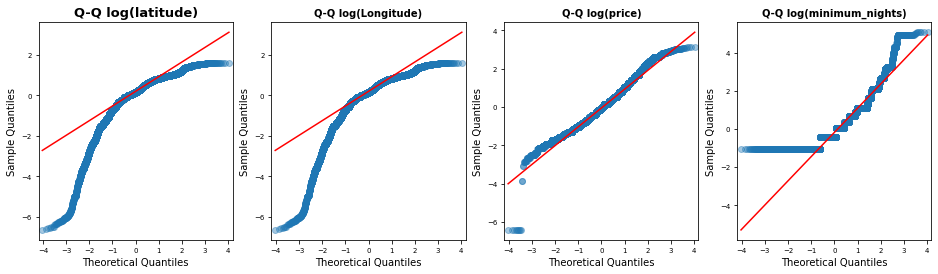

In [264]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

sm.qqplot(
    np.log1p(df_fil_noches_hc.longitude),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[0]
)
axs[0].set_title('Q-Q log(latitude)', fontsize = 13, fontweight = "bold")
axs[0].tick_params(labelsize = 7)

shapiro_test = stats.shapiro(np.log1p(df_fil_noches_hc.longitude))
print(f"Variable latitude: {shapiro_test}")

sm.qqplot(
    np.log1p(df_fil_noches_hc.longitude),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[1]
)
axs[1].set_title('Q-Q log(Longitude)', fontsize = 10, fontweight = "bold")
axs[1].tick_params(labelsize = 7)

shapiro_test = stats.shapiro(np.log1p(df_fil_noches_hc.longitude))
print(f"Variable longitude: {shapiro_test}")

sm.qqplot(
    np.log1p(df_fil_noches_hc.price),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[2]
)
axs[2].set_title('Q-Q log(price)', fontsize = 10, fontweight = "bold")
axs[2].tick_params(labelsize = 7)

shapiro_test = stats.shapiro(np.log1p(df_fil_noches_hc.price))
print(f"Variable price: {shapiro_test}")

sm.qqplot(
    np.log1p(df_fil_noches_hc.minimum_nights),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[3]
)
axs[3].set_title('Q-Q log(minimum_nights)', fontsize = 10, fontweight = "bold")
axs[3].tick_params(labelsize = 7)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Variable number_of_reviews: ShapiroResult(statistic=0.8810156583786011, pvalue=0.0)
Variable reviews_per_month: ShapiroResult(statistic=0.7746063470840454, pvalue=0.0)
Variable calculated_host_listings_count: ShapiroResult(statistic=0.5887252688407898, pvalue=0.0)
Variable availability_365s: ShapiroResult(statistic=0.8238413333892822, pvalue=0.0)


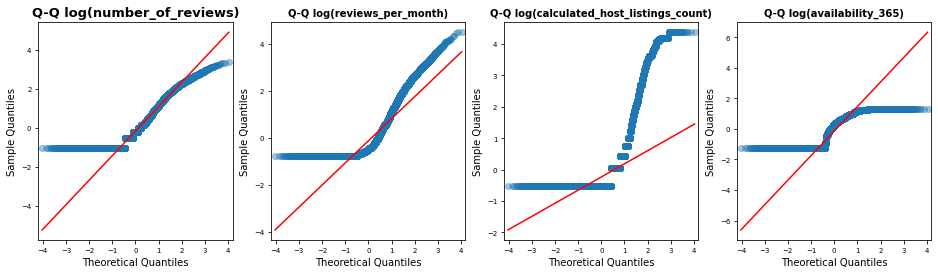

In [248]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 4))

sm.qqplot(
    np.log1p(df_fil_noches_hc.number_of_reviews),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[0]
)
axs[0].set_title('Q-Q log(number_of_reviews)', fontsize = 13, fontweight = "bold")
axs[0].tick_params(labelsize = 7)

shapiro_test = stats.shapiro(np.log1p(df_fil_noches_hc.number_of_reviews))
print(f"Variable number_of_reviews: {shapiro_test}")

sm.qqplot(
    np.log1p(df_fil_noches_hc.reviews_per_month),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[1]
)
axs[1].set_title('Q-Q log(reviews_per_month)', fontsize = 10, fontweight = "bold")
axs[1].tick_params(labelsize = 7)

shapiro_test = stats.shapiro(np.log1p(df_fil_noches_hc.reviews_per_month))
print(f"Variable reviews_per_month: {shapiro_test}")

sm.qqplot(
    np.log1p(df_fil_noches_hc.calculated_host_listings_count),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[2]
)
axs[2].set_title('Q-Q log(calculated_host_listings_count)', fontsize = 10, fontweight = "bold")
axs[2].tick_params(labelsize = 7)

shapiro_test = stats.shapiro(np.log1p(df_fil_noches_hc.calculated_host_listings_count))
print(f"Variable calculated_host_listings_count: {shapiro_test}")

sm.qqplot(
    np.log1p(df_fil_noches_hc.availability_365),
    fit   = True,
    line  = 'q',
    alpha = 0.4,
    lw    = 2,
    ax    = axs[3]
)
axs[3].set_title('Q-Q log(availability_365)', fontsize = 10, fontweight = "bold")
axs[3].tick_params(labelsize = 7)

shapiro_test = stats.shapiro(np.log1p(df_fil_noches_hc.availability_365))
print(f"Variable availability_365s: {shapiro_test}")


### Price ----> única la a variable que se normaliza con *log*.
* Se procede a crear la columna de log_price, para evaluar como se comportan las correlaciones y regresiones con esta variable transformada.


> ### 4.6. Creación de columna de log_price

In [130]:
df_fil_noches_hc['log_price'] = np.log1p(df_fil_noches_hc['price'])
df_fil_noches_hc.head(2)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,Host_name_and_Id,log_price
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187,32,"Stuart, Id:17061",4.615121
1,14250,Manly Harbour House,55948,Heidi,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321,20,"Heidi, Id:55948",6.156979


# ----------------------------------------------------------------------------------------------

## Conclusiones estadísticosdescriptivos.
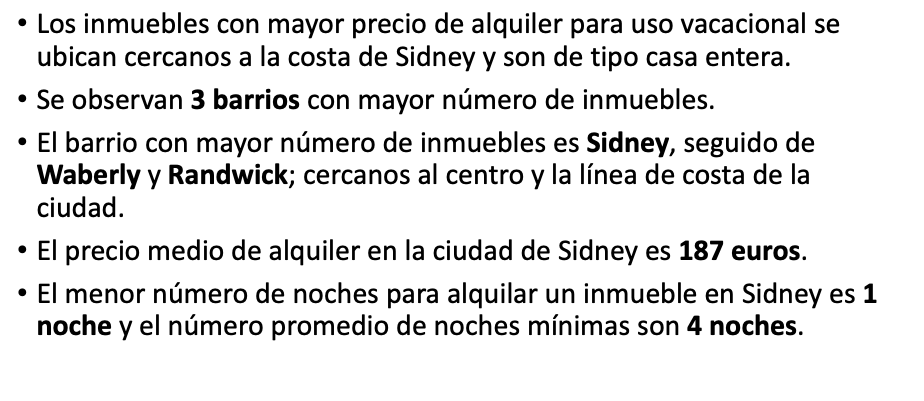


# 5. Estadística Descriptiva

> ### 5.1. Vista general

In [222]:
df_fil_noches_hc.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,log_price
count,3.547300e+04,3.547300e+04,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000,35473.000000
mean,1.849339e+07,6.685299e+07,-33.863439,151.203270,186.909791,4.180560,12.465002,0.783253,3.579398,94.506385,26.913145,4.917747
std,8.497188e+06,6.403445e+07,0.071679,0.084276,183.182324,7.056222,29.046646,1.385572,8.089836,121.681248,9.097114,0.767170
min,1.235100e+04,8.346000e+03,-34.135212,150.642903,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,1.159558e+07,1.519366e+07,-33.898681,151.178660,78.000000,1.000000,0.000000,0.000000,1.000000,0.000000,22.000000,4.369448
50%,2.027089e+07,4.347375e+07,-33.882906,151.215520,130.000000,2.000000,2.000000,0.160000,1.000000,33.000000,32.000000,4.875197
75%,2.523963e+07,1.068347e+08,-33.832333,151.261229,217.000000,5.000000,10.000000,0.960000,2.000000,159.000000,34.000000,5.384495
max,3.059387e+07,2.294790e+08,-33.389728,151.339811,1495.000000,100.000000,493.000000,15.180000,66.000000,365.000000,37.000000,7.310550


> ### 5.2. Medidas de centralizacion

Las medidas de centralización se pueden evaluar por cada una de las variables individualmente, o por todo el DataFrame.

In [233]:
# Media aritmetica en un dataframe
df_fil_noches_hc[numericas].mean()

latitude                          -33.863439
longitude                         151.203270
price                             186.909791
minimum_nights                      4.180560
number_of_reviews                  12.465002
reviews_per_month                   0.783253
calculated_host_listings_count      3.579398
availability_365                   94.506385
log_price                           4.917747
dtype: float64

In [231]:
# Mediana en un dataframe
df_fil_noches_hc[numericas].median()

latitude                          -33.882906
longitude                         151.215520
price                             130.000000
minimum_nights                      2.000000
number_of_reviews                   2.000000
reviews_per_month                   0.160000
calculated_host_listings_count      1.000000
availability_365                   33.000000
log_price                           4.875197
dtype: float64

In [236]:
# Moda en un dataframe
df_fil_noches_hc[numericas].mode()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,log_price
0,-34.135212,150.642903,150.0,1.0,0.0,0.0,1.0,0.0,5.01728
1,-34.126237,150.644964,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-34.098998,150.651014,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-34.098539,150.651941,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-34.094400,150.653748,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
35468,-33.400157,151.339678,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35469,-33.400149,151.339690,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35470,-33.399990,151.339789,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35471,-33.395751,151.339805,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [234]:
# Maximo en un dataframe
df_fil_noches_hc[numericas].max()

latitude                           -33.389728
longitude                          151.339811
price                             1495.000000
minimum_nights                     100.000000
number_of_reviews                  493.000000
reviews_per_month                   15.180000
calculated_host_listings_count      66.000000
availability_365                   365.000000
log_price                            7.310550
dtype: float64

In [235]:
# Minimo en un dataframe
df_fil_noches_hc[numericas].min()

latitude                          -34.135212
longitude                         150.642903
price                               0.000000
minimum_nights                      1.000000
number_of_reviews                   0.000000
reviews_per_month                   0.000000
calculated_host_listings_count      1.000000
availability_365                    0.000000
log_price                           0.000000
dtype: float64

In [237]:
# Valores de los cuartiles por variables
df_fil_noches_hc.price.quantile([0, .25, .5, .75, 1])

0.00       0.0
0.25      78.0
0.50     130.0
0.75     217.0
1.00    1495.0
Name: price, dtype: float64

## La agrupación por cuartiles puede ser útil para generar los grupos de los precios? 
## Es objetivo?

In [228]:
# Valores de los cuartiles en un dataframe
df_fil_noches_hc.quantile([0, .25, .5, .75, 1])

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,log_price
0.00,12351.0,8346.0,-34.135212,150.642903,0.0,1.0,0.0,0.00,1.0,0.0,0.0,0.000000
0.25,11595579.0,15193662.0,-33.898681,151.178660,78.0,1.0,0.0,0.00,1.0,0.0,22.0,4.369448
0.50,20270889.0,43473747.0,-33.882906,151.215520,130.0,2.0,2.0,0.16,1.0,33.0,32.0,4.875197
0.75,25239627.0,106834698.0,-33.832333,151.261229,217.0,5.0,10.0,0.96,2.0,159.0,34.0,5.384495
1.00,30593866.0,229479027.0,-33.389728,151.339811,1495.0,100.0,493.0,15.18,66.0,365.0,37.0,7.310550


> ### 5.3. Medidas de dispersión

In [ ]:
# Varianza
#X.var() #unbiased Normalized by N-1 by default.

In [238]:
df_fil_noches_hc[numericas].var()

latitude                              0.005138
longitude                             0.007103
price                             33555.763964
minimum_nights                       49.790272
number_of_reviews                   843.707623
reviews_per_month                     1.919809
calculated_host_listings_count       65.445439
availability_365                  14806.326083
log_price                             0.588551
dtype: float64

In [239]:
# Desviacion tipica o desviacion estandard
df_fil_noches_hc[numericas].std()

latitude                            0.071679
longitude                           0.084276
price                             183.182324
minimum_nights                      7.056222
number_of_reviews                  29.046646
reviews_per_month                   1.385572
calculated_host_listings_count      8.089836
availability_365                  121.681248
log_price                           0.767170
dtype: float64

In [240]:
# Coeficiente de Variacion
df_fil_noches_hc.price.std()/df_fil_noches_hc.price.mean()

0.9800574054596627

> ### 5.4. Medidas de asimetría 

Mide el grado de asimetría de la distribución con respecto a la media. 

**Coeficiente de Curtosis**

In [241]:
# unbiased kurtosis over requested axis using Fisher's definition
df_fil_noches_hc.price.kurtosis()

9.776209829205854

In [242]:
df_fil_noches_hc[numericas].kurtosis()

latitude                           3.336583
longitude                          6.821863
price                              9.776210
minimum_nights                    83.963666
number_of_reviews                 36.662739
reviews_per_month                 10.839635
calculated_host_listings_count    24.728346
availability_365                  -0.197006
log_price                          0.303179
dtype: float64

**Curtosis**
* Mide el grado de asimetría de la distribución con respecto a la media. 
* Un valor positivo de este indicador significa que la distribución se encuentra sesgada hacia la izquierda (orientación positiva). 
* Un resultado negativo significa que la distribución se sesga a la derecha.

# ----------------------------------------------------------------------------------------------

## Conclusiones sobre los patrones y relaciones de las variables.

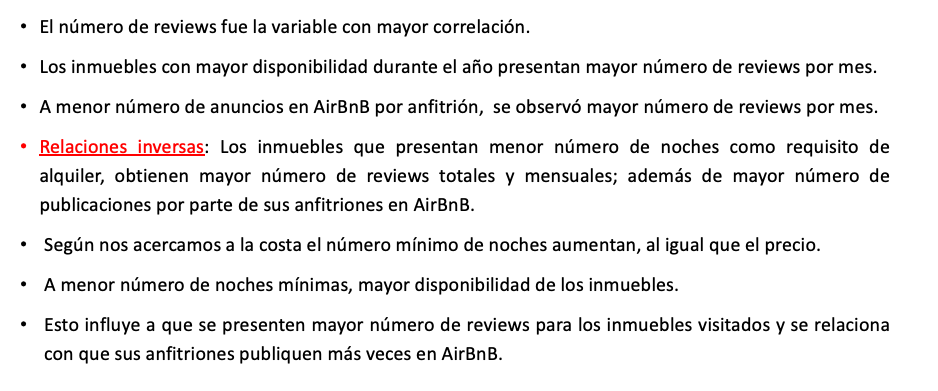

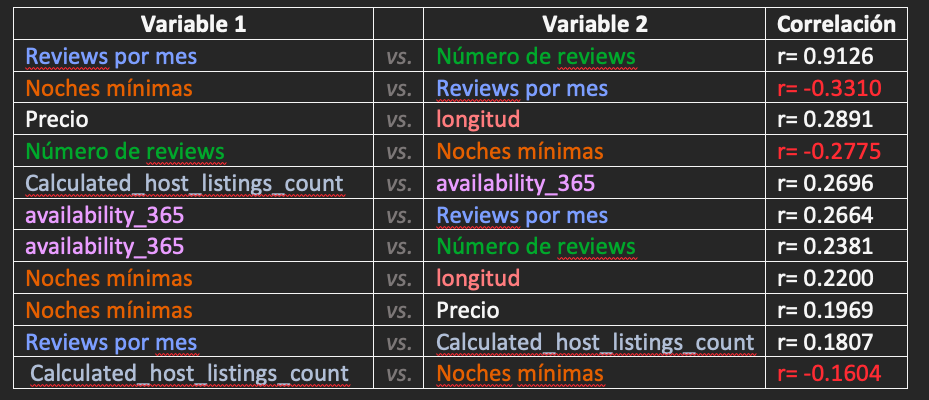

# 6. Correlación de variables

> ### 7.1. Coeficientes de correlación lineal 

#### Métodos de correlación de acuerdo al tipo de distribución de los datos:

* Si los datos no son **normales** tendremos que usar estadísticos **no paramétricos** adecuados para analizar datos que no se distribuyan normalmente.

* En el caso de los índices de correlación  ---> tendremos que usar **la correlación de Spearman**


#### Métodos de correlación:

* Cuantifican la asociación lineal entre dos variables numéricas. Existen diferentes tipos, de entre los que destacan el Pearson, Rho de Spearman y Tau de Kendall. Todos ellos comparten que:

* Su valor está comprendido en el rango [+1 , -1]. Siendo +1 una correlación positiva perfecta y -1 una correlación negativa perfecta.

* Se emplean como medida de la fuerza de asociación entre dos variables (tamaño del efecto):

**0: asociación nula.**
**0.1: asociación pequeña.**
**0.3: asociación mediana.**
**0.5: asociación moderada.**
**0.7: asociación alta.**
**0.9: asociación muy alta.**

Hay tres coeficientes:

* **La correlación de Pearson** funciona bien con variables cuantitativas que tienen una distribución normal o próxima a la normal. Es más sensible a los valores extremos que las otras dos alternativas.

* **La correlación de Spearman** se emplea con variables cuantitativas (continuas o discretas). En lugar de utilizar directamente el valor de cada variable, los datos son ordenados y reemplazados por su respectivo orden ranking. Es un método no paramétrico muy utilizado cuando no se satisface la condición de normalidad necesaria para aplicar la correlación de Pearson.

* **La correlación de Kendall** es otra alternativa no paramétrica que, al igual que la correlación de Spearman, utiliza la ordenación de las observaciones ranking. Es recomendable cuando se dispone de pocos datos y muchos de ellos ocupan la misma posición en el rango, es decir, cuando hay muchas ligaduras. 


> ### 7.2. Cálculo de correlación con Pandas (`.corr`) 

**Ejemplo**

print('Correlación Pearson: ', datos['weight'].corr(datos['height'], method='pearson'))
print('Correlación spearman: ', datos['weight'].corr(datos['height'], method='spearman'))
print('Correlación kendall: ', datos['weight'].corr(datos['height'], method='kendall'))

**Gráfica de la matriz de correlación, con el método elegido:**

corr = df.corr(method = 'spearman')
 sns.heatmap(corr, annot = True)
 plt.show()

* ### Matriz de correlación

In [131]:
# Matriz de correlación con Pandas
# ==============================================================================
corr_matrix = df_fil_noches_hc[numericas].corr(method='spearman')
corr_matrix

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,log_price
latitude,1.000000,0.127543,0.155205,0.004734,0.035376,0.028945,0.011417,0.098946,0.155205
longitude,0.127543,1.000000,0.289142,0.220070,-0.082093,-0.129978,-0.128904,-0.113671,0.289142
price,0.155205,0.289142,1.000000,0.196964,-0.029829,-0.063136,0.017367,0.123769,1.000000
minimum_nights,0.004734,0.220070,0.196964,1.000000,-0.277546,-0.331010,-0.160417,-0.101113,0.196964
number_of_reviews,0.035376,-0.082093,-0.029829,-0.277546,1.000000,0.912666,0.136439,0.238196,-0.029829
reviews_per_month,0.028945,-0.129978,-0.063136,-0.331010,0.912666,1.000000,0.180717,0.266443,-0.063136
calculated_host_listings_count,0.011417,-0.128904,0.017367,-0.160417,0.136439,0.180717,1.000000,0.269652,0.017367
availability_365,0.098946,-0.113671,0.123769,-0.101113,0.238196,0.266443,0.269652,1.000000,0.123769
log_price,0.155205,0.289142,1.000000,0.196964,-0.029829,-0.063136,0.017367,0.123769,1.000000


* ### Matriz de correlación en formato de tabla larga (tidy)

Las matrices de correlación tienen el inconveniente de tener un tamaño notable cuando se dispone de muchas variables. Para facilitar la identificación de pares de variables con correlaciones altas, es conveniente convertirlas en formato de tabla larga (tidy).

In [254]:
def tidy_corr_matrix(corr_mat):
    '''
    Función para convertir una matriz de correlación de pandas en formato tidy.
    '''
    corr_mat = corr_mat.stack().reset_index()
    corr_mat.columns = ['variable_1','variable_2','r']
    corr_mat = corr_mat.loc[corr_mat['variable_1'] != corr_mat['variable_2'], :]
    corr_mat['abs_r'] = np.abs(corr_mat['r'])
    corr_mat = corr_mat.sort_values('abs_r', ascending=False)
    
    return(corr_mat)

tidy_corr_matrix(corr_matrix).head (50)
#tidy_corr_matrix(corr_matrix)

,variable_1,variable_2,r,abs_r
74,log_price,price,1.000000,1.000000
26,price,log_price,1.000000,1.000000
41,number_of_reviews,reviews_per_month,0.912666,0.912666
49,reviews_per_month,number_of_reviews,0.912666,0.912666
48,reviews_per_month,minimum_nights,-0.331010,0.331010
32,minimum_nights,reviews_per_month,-0.331010,0.331010
73,log_price,longitude,0.289142,0.289142
11,longitude,price,0.289142,0.289142
19,price,longitude,0.289142,0.289142
17,longitude,log_price,0.289142,0.289142


* ### Heatmap matriz de correlaciones

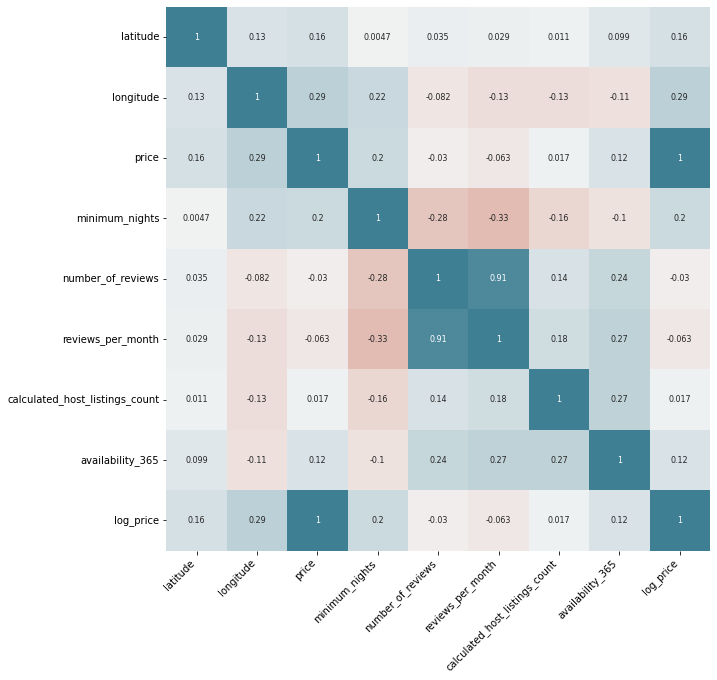

In [134]:
# Heatmap matriz de correlaciones
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

sns.heatmap(
    corr_matrix,
    annot     = True,
    cbar      = False,
    annot_kws = {"size": 8},
    vmin      = -1,
    vmax      = 1,
    center    = 0,
    cmap      = sns.diverging_palette(20, 220, n=200),
    square    = True,
    ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.tick_params(labelsize = 10)

> ### 7.3. Cálculo de correlación y significancia con Scipy

**`Scypy.stats`**

* La implementación de **`Scypy.stats`** sí permite calcular la significancia estadística además del coeficiente de correlación. 
* La función `stats.pearsonr()`----> devuelve un error si alguna de las observaciones contienen valores **NA/null**. 
* Las funciones `stats.spearmanr()` y `stats.kendalltau()` sí permiten excluirlos de forma automática si se indica `nan_policy='omit'`.

In [254]:
df_fil_noches_hc.head(1)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187


In [260]:
r, p = stats.spearmanr(df_fil_noches_hc['reviews_per_month'], df_fil_noches_hc['minimum_nights'], nan_policy='omit')
print(f"Correlación Spearman: r={r}, p-value={p}")

Correlación Spearman: r=-0.38943589736851, p-value=0.0


> ### 7.4. Cálculo de correlación, significancia e intervalos con `pingouin`

**`pingouin`**

* La librería **`Pingouin`** tiene una de las implementaciones más completas.  
* Con la función `corr()` se obtiene ----> coeficiente de correlación, su significancia, intervalo de confianza y poder estadístico entre otros.

In [259]:
display(pg.corr(df_fil_noches_hc['reviews_per_month'], df_fil_noches_hc['minimum_nights'], method='spearman'))

,n,r,CI95%,p-val,power
spearman,24065,-0.389436,"[-0.4, -0.38]",0.0,1.0


In [135]:
df_fil_noches_hc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35473 entries, 0 to 36661
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              35473 non-null  int64   
 1   name                            35461 non-null  object  
 2   host_id                         35473 non-null  int64   
 3   host_name                       35467 non-null  object  
 4   neighbourhood                   35473 non-null  category
 5   latitude                        35473 non-null  float64 
 6   longitude                       35473 non-null  float64 
 7   room_type                       35473 non-null  object  
 8   price                           35473 non-null  int64   
 9   minimum_nights                  35473 non-null  int64   
 10  number_of_reviews               35473 non-null  int64   
 11  last_review                     35473 non-null  object  
 12  reviews_per_month 

# ----------------------------------------------------------------------------------------------

# 7. Regresión lineal de variables

> ### 7.3. Regresión lineal

* Se realiza el análisis de **regresión lineal** para las variables que presentaron mayores coeficientes de correlación con el método de  *Spearman* (distribuón no paramétrica).
* Volvemos a observar los primeros *12* registros de la ónmatriz de correlaci (en el formato de tabla larga Tydy).

In [263]:
tidy_corr_matrix(corr_matrix).head (20)

,variable_1,variable_2,r,abs_r
37,number_of_reviews,reviews_per_month,0.732871,0.732871
44,reviews_per_month,number_of_reviews,0.732871,0.732871
29,minimum_nights,reviews_per_month,-0.389436,0.389436
43,reviews_per_month,minimum_nights,-0.389436,0.389436
61,availability_365,reviews_per_month,0.371729,0.371729
47,reviews_per_month,availability_365,0.371729,0.371729
10,longitude,price,0.289142,0.289142
17,price,longitude,0.289142,0.289142
35,number_of_reviews,minimum_nights,-0.277546,0.277546
28,minimum_nights,number_of_reviews,-0.277546,0.277546


* De esta manera se realizó la regresión lineal gráfica a **10 pares de variables**, las que tienen los primeros 10 coeficientes de correlación un poco mas significativos.

* #### `regplot` ----> Traza el diagrama de dispersión más la línea de regresión ajustada para los datos.

<function matplotlib.pyplot.show(close=None, block=None)>

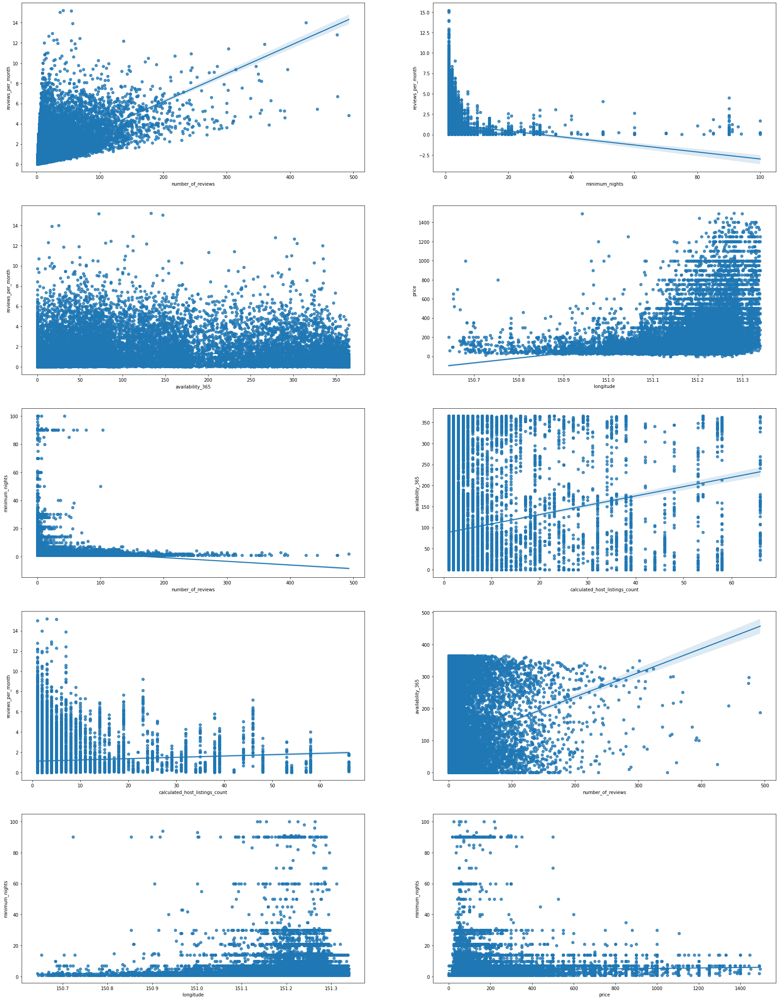

In [267]:
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(30, 40))

plt.subplot(5,2,1)
sns.regplot(x="number_of_reviews", y="reviews_per_month", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,2)
sns.regplot(x="minimum_nights", y="reviews_per_month", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,3)
sns.regplot(x="availability_365", y="reviews_per_month", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,4)
sns.regplot(x="longitude", y="price", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,5)
sns.regplot(x="number_of_reviews", y="minimum_nights", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,6)
sns.regplot(x="calculated_host_listings_count", y="availability_365", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,7)
sns.regplot(x="calculated_host_listings_count", y="reviews_per_month", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,8)
sns.regplot(x="number_of_reviews", y="availability_365", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,9)
sns.regplot(x="longitude", y="minimum_nights", data=df_fil_noches_hc)
plt.ylim()

plt.subplot(5,2,10)
sns.regplot(x="price", y="minimum_nights", data=df_fil_noches_hc)
plt.ylim()

plt.show


* ### Modelos de regresion lineal y predicciones ----> y = mX + b

**X** = variable X

**Y**= variable a predecir

**m**= Coeficiente

**b**= Término independiente


* **Coefficients: `\n', regr.coef`** --------> coeficientes obtenidos (Tangente) 

* **'Independent term: `\n', regr.intercept`** --------> Este es el valor donde corta el eje Y (en X=0)

* **"Mean squared error: `%.2f" % mean_squared_error(y_train, y_pre)`** -------->  Error Cuadrado Medio

* **'Variance score: %.2f' % r2_score(y_train, y_pred)** --------> Puntaje de Varianza. El mejor puntaje es un 1.0



In [271]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

### Todas las regresiones de `reviews_per_month` hay que hacerlas haciendo el drop de las filas que no tienen datos.

In [263]:
tidy_corr_matrix(corr_matrix).head (20)

,variable_1,variable_2,r,abs_r
37,number_of_reviews,reviews_per_month,0.732871,0.732871
44,reviews_per_month,number_of_reviews,0.732871,0.732871
29,minimum_nights,reviews_per_month,-0.389436,0.389436
43,reviews_per_month,minimum_nights,-0.389436,0.389436
61,availability_365,reviews_per_month,0.371729,0.371729
47,reviews_per_month,availability_365,0.371729,0.371729
10,longitude,price,0.289142,0.289142
17,price,longitude,0.289142,0.289142
35,number_of_reviews,minimum_nights,-0.277546,0.277546
28,minimum_nights,number_of_reviews,-0.277546,0.277546


* ### Modelo de regresion lineal ----> Longitud vs Precio

In [279]:
# Asignamos nuestra variable de entrada X para entrenamiento y las etiquetas Y.
dataX =df_fil_noches_hc[["longitude"]]
X_train = np.array(dataX)
y_train = df_fil_noches_hc['price'].values
 
# Creamos el objeto de Regresión Linear
regr = linear_model.LinearRegression()
 
# Entrenamos nuestro modelo
regr.fit(X_train, y_train)
 
# Hacemos las predicciones que en definitiva una línea (en este caso, al ser 2D)
y_pred = regr.predict(X_train)
 
# Veamos los coeficienetes obtenidos, En nuestro caso, serán la Tangente
print('Coefficients: \n', regr.coef_)
# Este es el valor donde corta el eje Y (en X=0)
print('Independent term: \n', regr.intercept_)
# Error Cuadrado Medio
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# Puntaje de Varianza. El mejor puntaje es un 1.0
print('Variance score: %.2f' % r2_score(y_train, y_pred))

Coefficients: 
 [508.9204476]
Independent term: 
 -76763.52616938877
Mean squared error: 31715.32
Variance score: 0.05


* ### Modelo de regresion lineal  ----> Precio (Y) = 508.92X + (-76763.52)
**y = mX + b**
**X** = Longitud

**Y**= Precio

**m**= Coeficiente

**b**= Término independiente

**Nota**: 
*  Error Cuadrático medio enorme
* Varianza muy alejada de 1

In [282]:
#Vamos a comprobar:
# Quiero predecir cuántos "Shares" voy a obtener por un artículo con 2.000 palabras,
# según nuestro modelo, hacemos:
#y_Dosmil = regr.predict([[2000]])
#print(int(y_Dosmil))

* ### Predicción Precio con base a longitud

In [1]:
#Vamos a comprobar:
# Quiero predecir cuántos "Shares" voy a obtener por un artículo con 2.000 palabras,
# según nuestro modelo, hacemos:
y_Dosmil = regr.predict([[20]])
print(int(y_Dosmil))

NameError: name 'regr' is not defined

In [274]:
# Asignamos nuestra variable de entrada X para entrenamiento y las etiquetas Y.
dataX =df_fil_noches_hc[["calculated_host_listings_count"]]
X_train = np.array(dataX)
y_train = df_fil_noches_hc['availability_365'].values
 
# Creamos el objeto de Regresión Linear
regr = linear_model.LinearRegression()
 
# Entrenamos nuestro modelo
regr.fit(X_train, y_train)
 
# Hacemos las predicciones que en definitiva una línea (en este caso, al ser 2D)
y_pred = regr.predict(X_train)
 
# Veamos los coeficienetes obtenidos, En nuestro caso, serán la Tangente
print('Coefficients: \n', regr.coef_)
# Este es el valor donde corta el eje Y (en X=0)
print('Independent term: \n', regr.intercept_)
# Error Cuadrado Medio
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# Puntaje de Varianza. El mejor puntaje es un 1.0
print('Variance score: %.2f' % r2_score(y_train, y_pred))

Coefficients: 
 [2.21219088]
Independent term: 
 86.58807260544032
Mean squared error: 14485.64
Variance score: 0.02


In [275]:
# Asignamos nuestra variable de entrada X para entrenamiento y las etiquetas Y.
dataX =df_fil_noches_hc[["longitude"]]
X_train = np.array(dataX)
y_train = df_fil_noches_hc['minimum_nights'].values
 
# Creamos el objeto de Regresión Linear
regr = linear_model.LinearRegression()
 
# Entrenamos nuestro modelo
regr.fit(X_train, y_train)
 
# Hacemos las predicciones que en definitiva una línea (en este caso, al ser 2D)
y_pred = regr.predict(X_train)
 
# Veamos los coeficienetes obtenidos, En nuestro caso, serán la Tangente
print('Coefficients: \n', regr.coef_)
# Este es el valor donde corta el eje Y (en X=0)
print('Independent term: \n', regr.intercept_)
# Error Cuadrado Medio
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# Puntaje de Varianza. El mejor puntaje es un 1.0
print('Variance score: %.2f' % r2_score(y_train, y_pred))

Coefficients: 
 [4.6075864]
Independent term: 
 -692.501571949389
Mean squared error: 49.64
Variance score: 0.00


In [283]:
# Asignamos nuestra variable de entrada X para entrenamiento y las etiquetas Y.
dataX =df_fil_noches_hc[["price"]]
X_train = np.array(dataX)
y_train = df_fil_noches_hc['minimum_nights'].values
 
# Creamos el objeto de Regresión Linear
regr = linear_model.LinearRegression()
 
# Entrenamos nuestro modelo
regr.fit(X_train, y_train)
 
# Hacemos las predicciones que en definitiva una línea (en este caso, al ser 2D)
y_pred = regr.predict(X_train)
 
# Veamos los coeficienetes obtenidos, En nuestro caso, serán la Tangente
print('Coefficients: \n', regr.coef_)
# Este es el valor donde corta el eje Y (en X=0)
print('Independent term: \n', regr.intercept_)
# Error Cuadrado Medio
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# Puntaje de Varianza. El mejor puntaje es un 1.0
print('Variance score: %.2f' % r2_score(y_train, y_pred))

Coefficients: 
 [0.00140136]
Independent term: 
 3.918631186710407
Mean squared error: 49.72
Variance score: 0.00


* ### y = mX + b ----> Min. Noches (Y) = 0.00140136X + (3.918631186710407)

**X** = Precio

**Y**= Min. Noches

**m**= Coeficiente

**b**= Término independiente

**Nota**: 
*  Error Cuadrático medio enorme
* Varianza muy alejada de 1

* ### Predicción Min. Noches con base a Precio

In [284]:
#Vamos a comprobar:
# Quiero predecir cuántos "Shares" voy a obtener por un artículo con 2.000 palabras,
# según nuestro modelo, hacemos:
y_Dosmil = regr.predict([[2000]])
print(int(y_Dosmil))

6


### Chicos diganme que variables quieren predecir y con base en que variable y asi definimos los modelos a presentar en este ejercicio. 

# ----------------------------------------------------------------------------------------------

# 8. Visualización gráfica de datos

> ### 8.1. Gráficos bivariados y n-variados con df filtrado (`df_fil_noches_hc`) sin outliers

Se puede utilizar para bases de datos con muestras mayor a 20, aunque no tengan una distribución normal.

> * #### Gráfico bivariado de `"longitude"`y `"latitude"` 

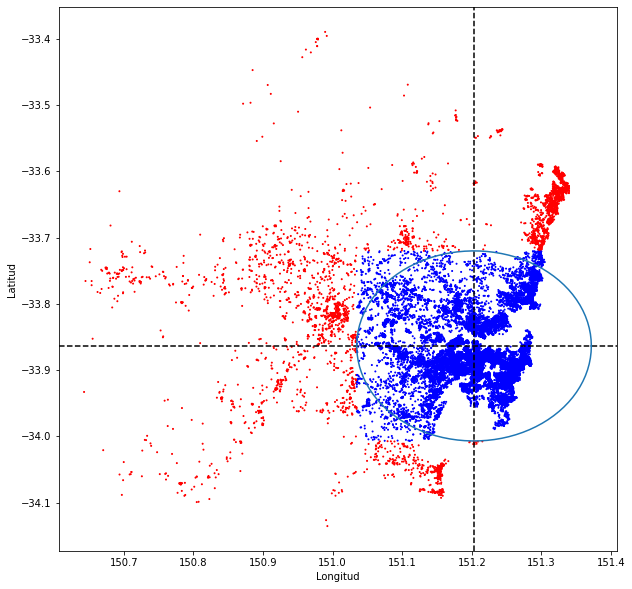

In [11]:
from math import pi
longitude = df_fil_noches_hc.iloc[:, 6]
latitude = df_fil_noches_hc.iloc[:, 5]
media = (latitude).mean()
std_x = (latitude).std()*2
media_y = (longitude).mean()
std_y = (longitude).std()*2
 
colors = ['blue']*len(latitude)
for index, x in enumerate(latitude):
    if abs(x-media) > std_x:
        colors[index] = 'red'
        
for index, x in enumerate(longitude):
    if abs(x-media_y) > std_y:
        colors[index] = 'red'
 
plt.figure(figsize=(10,10))
plt.scatter(longitude, latitude, s=1, color=colors)
plt.axhline(media, color='k', linestyle='--')
plt.axvline(media_y, color='k', linestyle='--')
 
v=media     #y-position of the center
u=media_y    #x-position of the center
b=std_x     #radius on the y-axis
a=std_y    #radius on the x-axis
 
t = np.linspace(0, 2*pi, 100)
plt.plot( u+a*np.cos(t) , v+b*np.sin(t) )
 
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

> * #### Gráfico bivariado de `"price"`con `"longitude"`y `"latitude"`

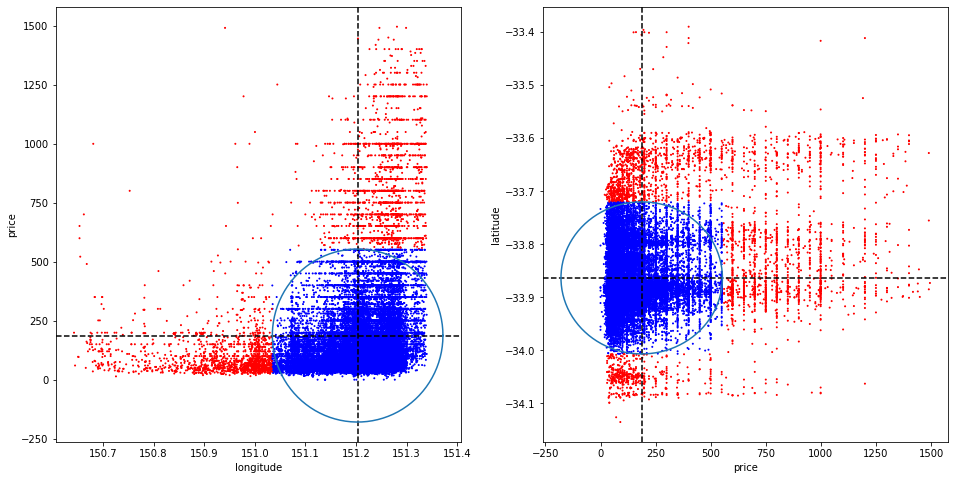

In [13]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16,8))
price = df_fil_noches_hc.iloc[:, 8]
media = (price).mean()
std_x = (price).std()*2
media_y = (longitude).mean()
std_y = (longitude).std()*2

colors = ['blue']*len(price)
for index, x in enumerate(price):
    if abs(x-media) > std_x:
        colors[index] = 'red'
        
for index, x in enumerate(longitude):
    if abs(x-media_y) > std_y:
        colors[index] = 'red'
 
plt.subplot(1,2,1)
plt.scatter(longitude, price, s=1, color=colors)
plt.axhline(media, color='k', linestyle='--')
plt.axvline(media_y, color='k', linestyle='--')
 
v=media     #y-position of the center
u=media_y    #x-position of the center
b=std_x     #radius on the y-axis
a=std_y    #radius on the x-axis
 
t = np.linspace(0, 2*pi, 100)
plt.plot( u+a*np.cos(t) , v+b*np.sin(t) )
 
plt.xlabel('longitude')
plt.ylabel('price')


plt.subplot(1,2,2)
media = (latitude).mean()
std_x = (latitude).std()*2
media_y = (price).mean()
std_y = (price).std()*2

colors = ['blue']*len(price)
for index, x in enumerate(latitude):
    if abs(x-media) > std_x:
        colors[index] = 'red'
        
for index, x in enumerate(price):
    if abs(x-media_y) > std_y:
        colors[index] = 'red'
 

plt.scatter(price, latitude, s=1, color=colors)
plt.axhline(media, color='k', linestyle='--')
plt.axvline(media_y, color='k', linestyle='--')
 
v=media     #y-position of the center
u=media_y    #x-position of the center
b=std_x     #radius on the y-axis
a=std_y    #radius on the x-axis
 
t = np.linspace(0, 2*pi, 100)
plt.plot( u+a*np.cos(t) , v+b*np.sin(t) )
 
plt.xlabel('price')
plt.ylabel('latitude')
plt.show()

> * #### Gráficos bivariados varios grupos de variables:

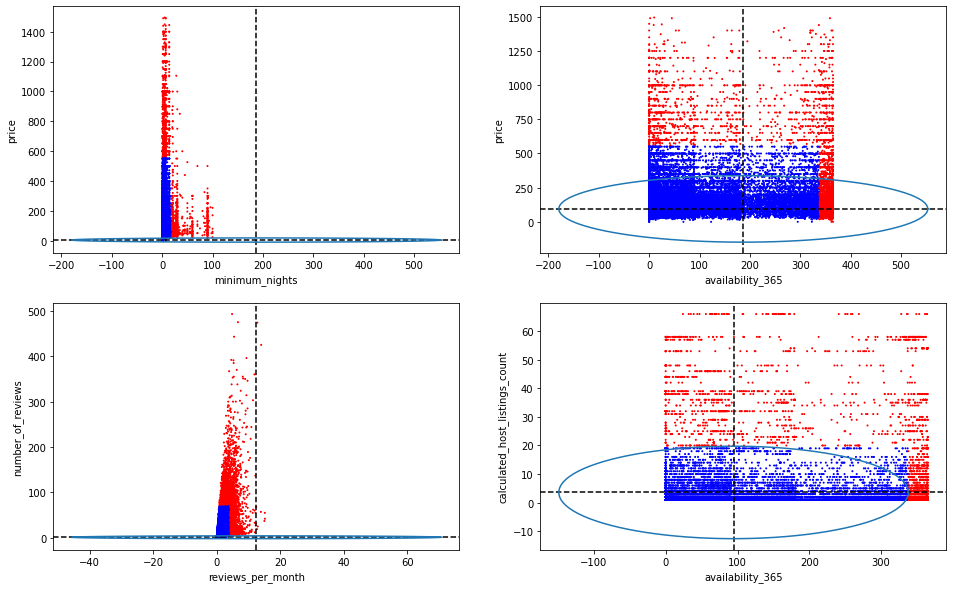

In [15]:
minimum_nights = df_fil_noches_hc.iloc[:, 9]
number_of_reviews = df_fil_noches_hc.iloc[:, 10]
reviews_per_month = df_fil_noches_hc.iloc[:, 12]
calculated_host_listings_count = df_fil_noches_hc.iloc[:, 13]
availability_365 = df_fil_noches_hc.iloc[:, 14]

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(16, 10))

media = (minimum_nights).mean()
std_x = (minimum_nights).std()*2
media_y = (price).mean()
std_y = (price).std()*2

colors = ['blue']*len(price)
for index, x in enumerate(minimum_nights):
    if abs(x-media) > std_x:
        colors[index] = 'red'
        
for index, x in enumerate(price):
    if abs(x-media_y) > std_y:
        colors[index] = 'red'
 
plt.subplot(2,2,1)
plt.scatter(minimum_nights, price, s=1, color=colors)
plt.axhline(media, color='k', linestyle='--')
plt.axvline(media_y, color='k', linestyle='--')
 
v=media     #y-position of the center
u=media_y    #x-position of the center
b=std_x     #radius on the y-axis
a=std_y    #radius on the x-axis
 
t = np.linspace(0, 2*pi, 100)
plt.plot( u+a*np.cos(t) , v+b*np.sin(t) )
 
plt.xlabel('minimum_nights')
plt.ylabel('price')


media = (availability_365).mean()
std_x = (availability_365).std()*2
media_y = (price).mean()
std_y = (price).std()*2

colors = ['blue']*len(price)
for index, x in enumerate(availability_365):
    if abs(x-media) > std_x:
        colors[index] = 'red'
        
for index, x in enumerate(price):
    if abs(x-media_y) > std_y:
        colors[index] = 'red'
 
plt.subplot(2,2,2)
plt.scatter(availability_365, price, s=1, color=colors)
plt.axhline(media, color='k', linestyle='--')
plt.axvline(media_y, color='k', linestyle='--')
 
v=media     #y-position of the center
u=media_y    #x-position of the center
b=std_x     #radius on the y-axis
a=std_y    #radius on the x-axis
 
t = np.linspace(0, 2*pi, 100)
plt.plot( u+a*np.cos(t) , v+b*np.sin(t) )
 
plt.xlabel('availability_365')
plt.ylabel('price')


media = (reviews_per_month).mean()
std_x = (reviews_per_month).std()*2
media_y = (number_of_reviews).mean()
std_y = (number_of_reviews).std()*2

colors = ['blue']*len(reviews_per_month)
for index, x in enumerate(reviews_per_month):
    if abs(x-media) > std_x:
        colors[index] = 'red'
        
for index, x in enumerate(number_of_reviews):
    if abs(x-media_y) > std_y:
        colors[index] = 'red'
 
plt.subplot(2,2,3)
plt.scatter(reviews_per_month, number_of_reviews, s=1, color=colors)
plt.axhline(media, color='k', linestyle='--')
plt.axvline(media_y, color='k', linestyle='--')
 
v=media     #y-position of the center
u=media_y    #x-position of the center
b=std_x     #radius on the y-axis
a=std_y    #radius on the x-axis
 
t = np.linspace(0, 2*pi, 100)
plt.plot( u+a*np.cos(t) , v+b*np.sin(t) )
 
plt.xlabel('reviews_per_month')
plt.ylabel('number_of_reviews')


media = (calculated_host_listings_count).mean()
std_x = (calculated_host_listings_count).std()*2
media_y = (availability_365).mean()
std_y = (availability_365).std()*2

colors = ['blue']*len(calculated_host_listings_count)
for index, x in enumerate(calculated_host_listings_count):
    if abs(x-media) > std_x:
        colors[index] = 'red'
        
for index, x in enumerate(availability_365):
    if abs(x-media_y) > std_y:
        colors[index] = 'red'
 
plt.subplot(2,2,4)
plt.scatter(availability_365, calculated_host_listings_count, s=1, color=colors)
plt.axhline(media, color='k', linestyle='--')
plt.axvline(media_y, color='k', linestyle='--')
 
v=media     #y-position of the center
u=media_y    #x-position of the center
b=std_x     #radius on the y-axis
a=std_y    #radius on the x-axis
 
t = np.linspace(0, 2*pi, 100)
plt.plot( u+a*np.cos(t) , v+b*np.sin(t) )
 
plt.xlabel('availability_365')
plt.ylabel('calculated_host_listings_count')

plt.show()

> * #### Gráfico multivariado de `"longitude"`, `"latitude"` y `"price"`

/var/folders/2z/y9k9szx937n84ztg148l8rd00000gn/T/ipykernel_775/3626316187.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


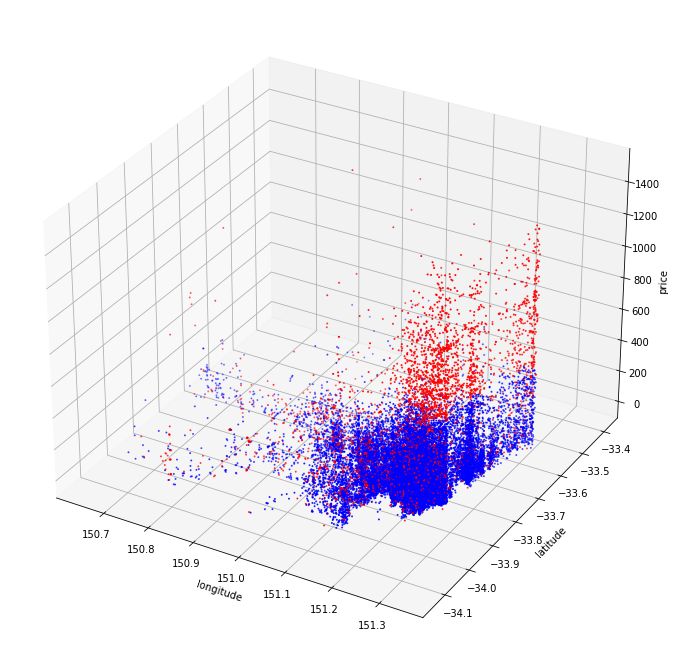

In [17]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12,12))
ax = fig.gca(projection='3d')

media_z = (price).mean()
std_z = (price).std()*2

for index, x in enumerate(price):
    if abs(x-media_z) > std_z:
        colors[index] = 'red'

ax.scatter(longitude, latitude, price, s=1, c=colors)
plt.xlabel('longitude')
plt.ylabel('latitude')
ax.set_zlabel('price')

plt.show()

> ### Gráficos por tipos de variables: `categoricas` & `numericas`

> ### 5.2. Subsets Variables Categóricas

In [34]:
categoricas


['id',
 'host_id',
 'name',
 'host_name',
 'neighbourhood',
 'room_type',
 'last_review']

 **Convertimos el conteo de inmbuebles por cada una de las variables cateógricas en un DataFrame para su visualización gráfica.**

* Use `.rename_axis` for name of column from index and `.reset_index`:

> **id_house *vs* Número de inmuebles AirBnB**

In [18]:
id_house = df_fil_noches_hc.id.value_counts().rename_axis('id_house').reset_index(name='Número de inmuebles AirBnB')
id_house.head(2)

,id_house,Número de inmuebles AirBnB
0,12351,1
1,22990712,1


> **host_id *vs* Número de inmuebles AirBnB**

In [19]:
host_id = df_fil_noches_hc.host_id.value_counts().rename_axis('host_id').reset_index(name='Número de inmuebles AirBnB')
host_id.head(2)

,host_id,Número de inmuebles AirBnB
0,71016455,66
1,15651267,58


* **Host_name *vs* Número de inmuebles AirBnB**

In [20]:
host_name = df_fil_noches_hc.host_name.value_counts().rename_axis('Host_name').reset_index(name='Número de inmuebles AirBnB')
host_name.head (2)

,Host_name,Número de inmuebles AirBnB
0,David,384
1,Sarah,259


In [21]:
#host_name.info()

> **Neighbourhood *vs* Número de inmuebles AirBnB**

In [22]:
neighbourhood_value = df_fil_noches_hc.neighbourhood.value_counts().rename_axis('Neighbourhood').reset_index(name='Número de inmuebles AirBnB')
neighbourhood_value.head (2)

,Neighbourhood,Número de inmuebles AirBnB
0,Sydney,8950
1,Waverley,5297


In [23]:
#neighbourhood_value.info()

> **Room type *vs* Número de inmuebles AirBnB**

In [41]:
room_type_value = df_fil_noches_hc.room_type.value_counts().rename_axis('Room type').reset_index(name='Número de inmuebles AirBnB')
room_type_value

,Room type,Número de inmuebles AirBnB
0,Entire home/apt,21781
1,Private room,13064
2,Shared room,628


In [24]:
#room_type_value.info()

>### 5.3. Visualización gráfica variables categóricas   ------> `room_type` & `neighbourhood`

* **Room type**

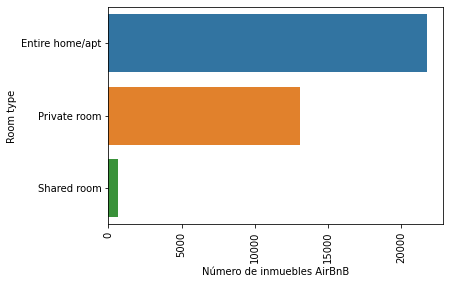

In [43]:
#plt.figure(figsize=(10,6))
sns.barplot(x = "Número de inmuebles AirBnB", y = "Room type", data = room_type_value)
#plt.xticks(rotation=90)
plt.show()

* **Neighbourhood**

In [1]:
nhgroup1 = df_fil_noches_hc.groupby('neighbourhood')['price'].agg(['min', 'max' , 'mean'])
nhgroup1.valuesort(ascending=true)

NameError: name 'df_fil_noches_hc' is not defined

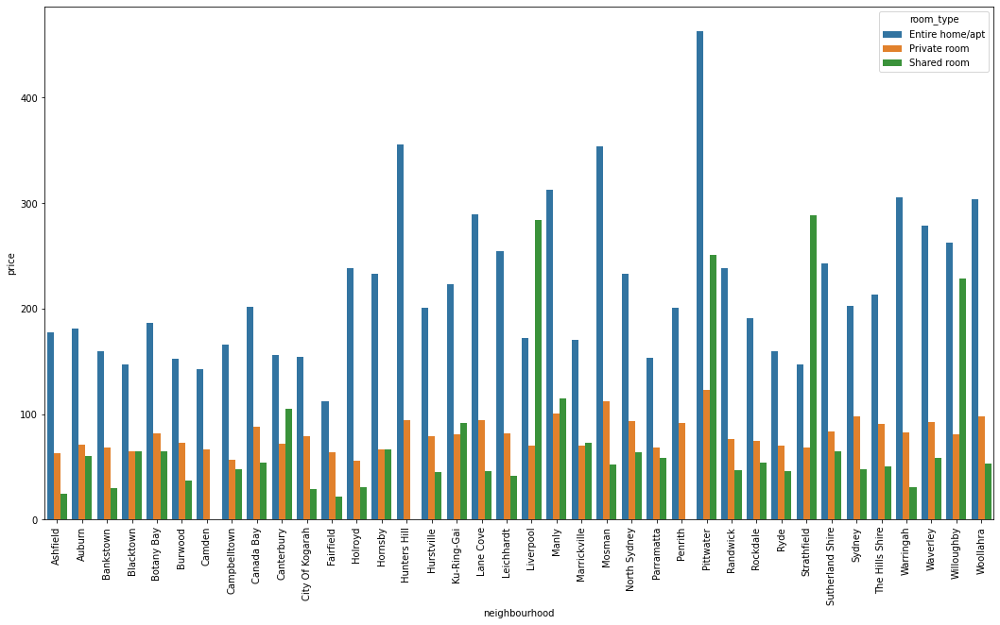

In [294]:
plt.figure(figsize=(18,10))
sns.barplot(data = df_tabla, x = 'neighbourhood', y = 'price', hue='room_type')
plt.xticks(rotation=90)
plt.show()

#sns.countplot(x = 'neighbourhood', data=datos, order = datos['neighbourhood'].value_counts().index)

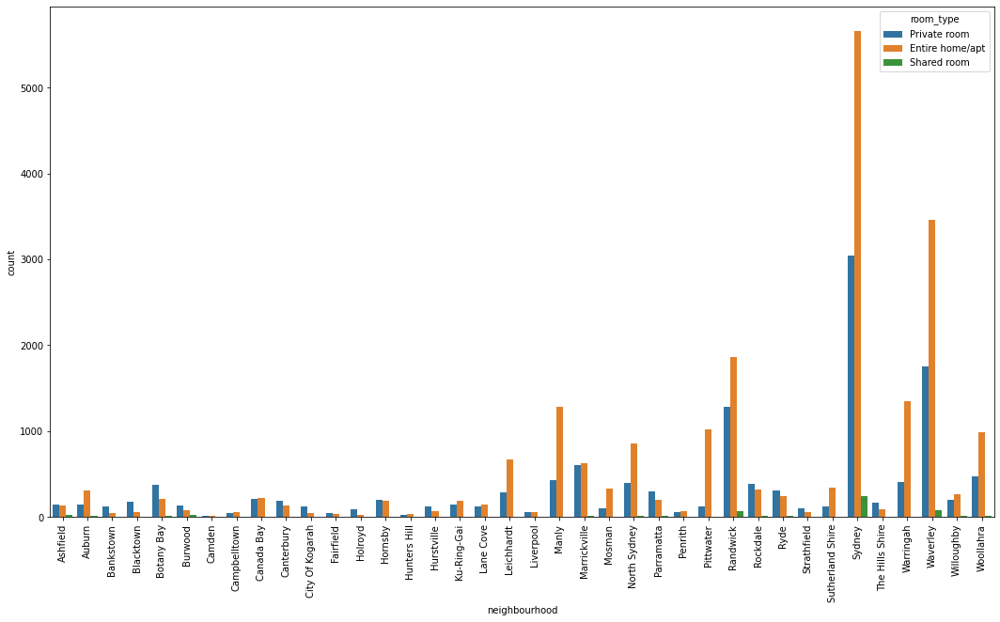

In [278]:
plt.figure(figsize=(18,10))
sns.countplot(data = df_fil_noches_hc, x = 'neighbourhood', hue='room_type')
plt.xticks(rotation=90)
plt.show()

#sns.countplot(x = 'neighbourhood', data=datos, order = datos['neighbourhood'].value_counts().index)

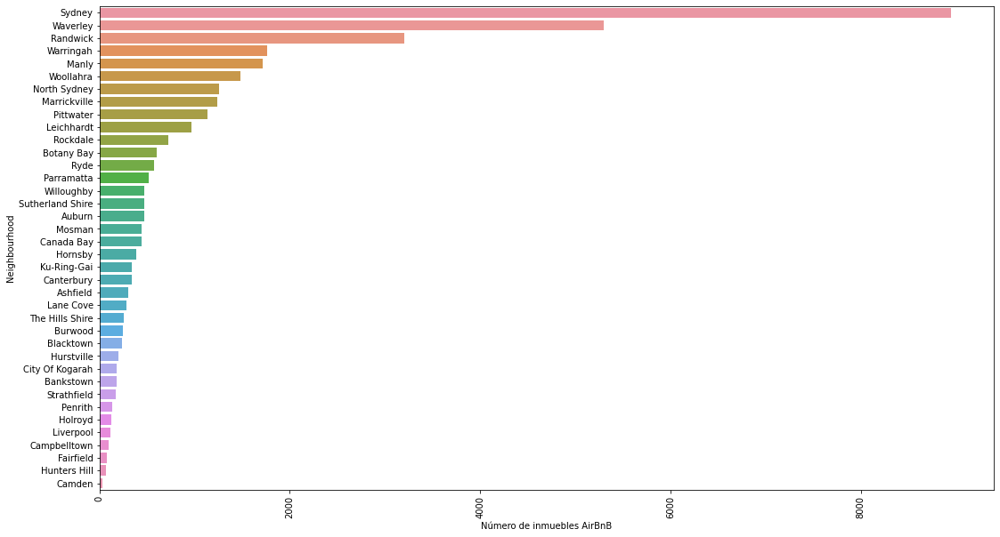

In [268]:
plt.figure(figsize=(18,10))
sns.barplot(x = "Número de inmuebles AirBnB", y = "Neighbourhood", data = neighbourhood_value)
plt.xticks(rotation=90)
plt.show()

> #### Diagrama de Cajas y Bigotes------> `room_type`
* room_type vs price
* room_type vs minimum_nights
* room_type vs calculated_host_listings_count
* room_type vs availability_365
* room_type vs number_of_reviews
* room_type vs reviews_per_month

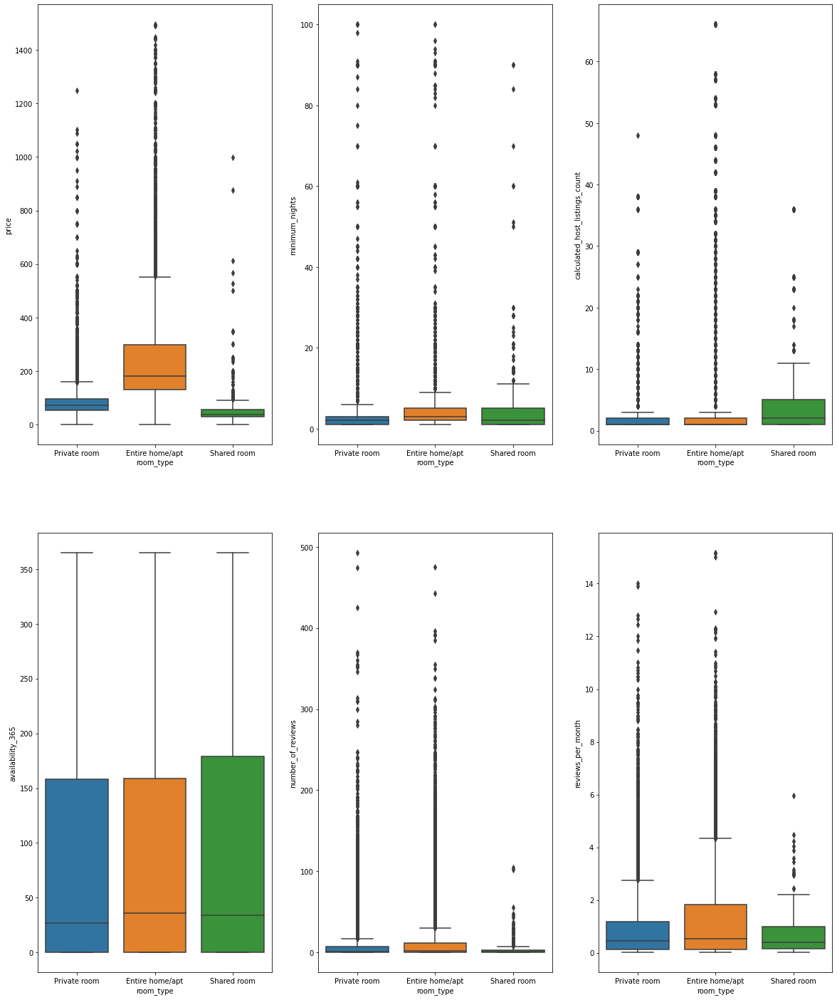

In [26]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 25))

plt.subplot(2,3,1)
sns.boxplot(x='room_type', y='price', data=df_fil_noches_hc)
plt.ylim()

plt.subplot(2,3,2)
sns.boxplot(x='room_type', y='minimum_nights', data=df_fil_noches_hc)
plt.ylim()

plt.subplot(2,3,3)
sns.boxplot(x='room_type', y='calculated_host_listings_count', data=df_fil_noches_hc)
plt.ylim()

plt.subplot(2,3,4)
sns.boxplot(x='room_type', y='availability_365', data=df_fil_noches_hc)
plt.ylim()

plt.subplot(2,3,5)
sns.boxplot(x='room_type', y='number_of_reviews', data=df_fil_noches_hc)
plt.ylim()

plt.subplot(2,3,6)
sns.boxplot(x='room_type', y='reviews_per_month', data=df_fil_noches_hc)
plt.ylim()

plt.show()

> #### Diagrama de Cajas y Bigotes------> `neighbourhood`
* neighbourhood vs price
* neighbourhood vs minimum_nights
* neighbourhood vs calculated_host_listings_count
* neighbourhood vs availability_365
* neighbourhood vs number_of_reviews
* neighbourhood vs reviews_per_month

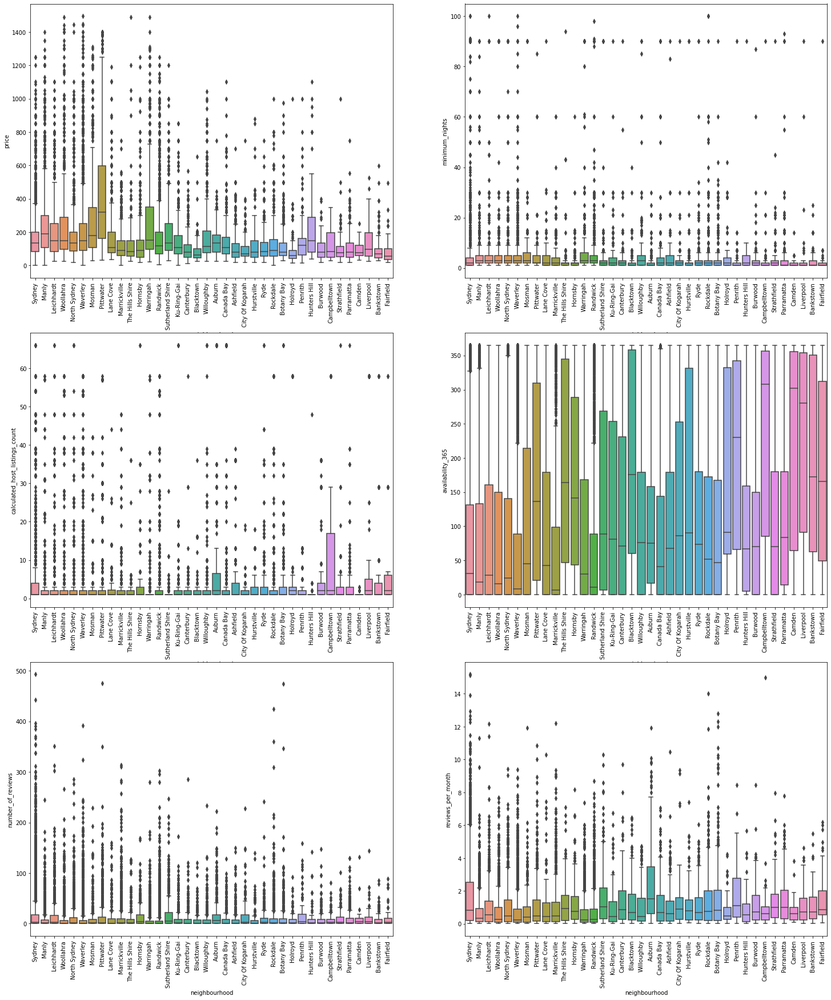

In [27]:
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(25, 30))

plt.subplot(3,2,1)
sns.boxplot(x='neighbourhood', y='price', data=df_fil_noches_hc)
plt.xticks(rotation=90)
plt.ylim()

plt.subplot(3,2,2)
sns.boxplot(x='neighbourhood', y='minimum_nights', data=df_fil_noches_hc)
plt.xticks(rotation=90)
plt.ylim()

plt.subplot(3,2,3)
sns.boxplot(x='neighbourhood', y='calculated_host_listings_count', data=df_fil_noches_hc)
plt.xticks(rotation=90)
plt.ylim()

plt.subplot(3,2,4)
sns.boxplot(x='neighbourhood', y='availability_365', data=df_fil_noches_hc)
plt.xticks(rotation=90)
plt.ylim()

plt.subplot(3,2,5)
sns.boxplot(x='neighbourhood', y='number_of_reviews', data=df_fil_noches_hc)
plt.xticks(rotation=90)
plt.ylim()

plt.subplot(3,2,6)
sns.boxplot(x='neighbourhood', y='reviews_per_month', data=df_fil_noches_hc)
plt.xticks(rotation=90)
plt.ylim()

plt.show()

> ### 5.3. Variables numéricas

In [28]:
numericas   # 8 variables numéricas

['latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

> **Longitude *vs* Número de inmuebles AirBnB**

In [226]:
lon = df_fil_noches_hc.longitude.value_counts().rename_axis('Longitude').reset_index(name='Número de inmuebles AirBnB')
lon.head (5)

,Longitude,Número de inmuebles AirBnB
0,151.191896,1
1,151.201916,1
2,151.269127,1
3,151.265511,1
4,150.984749,1


> **Latitude *vs* Número de inmuebles AirBnB**

In [227]:
lat = df_fil_noches_hc.latitude.value_counts().rename_axis('Latitude').reset_index(name='Número de inmuebles AirBnB')
lat.head (5)

,Latitude,Número de inmuebles AirBnB
0,-33.865153,1
1,-33.892047,1
2,-33.893575,1
3,-33.888045,1
4,-33.818459,1


>### 5.4. Visualización gráfica variables numéricas

#### Matriz de gráficos de variables numéricas

<function matplotlib.pyplot.show(close=None, block=None)>

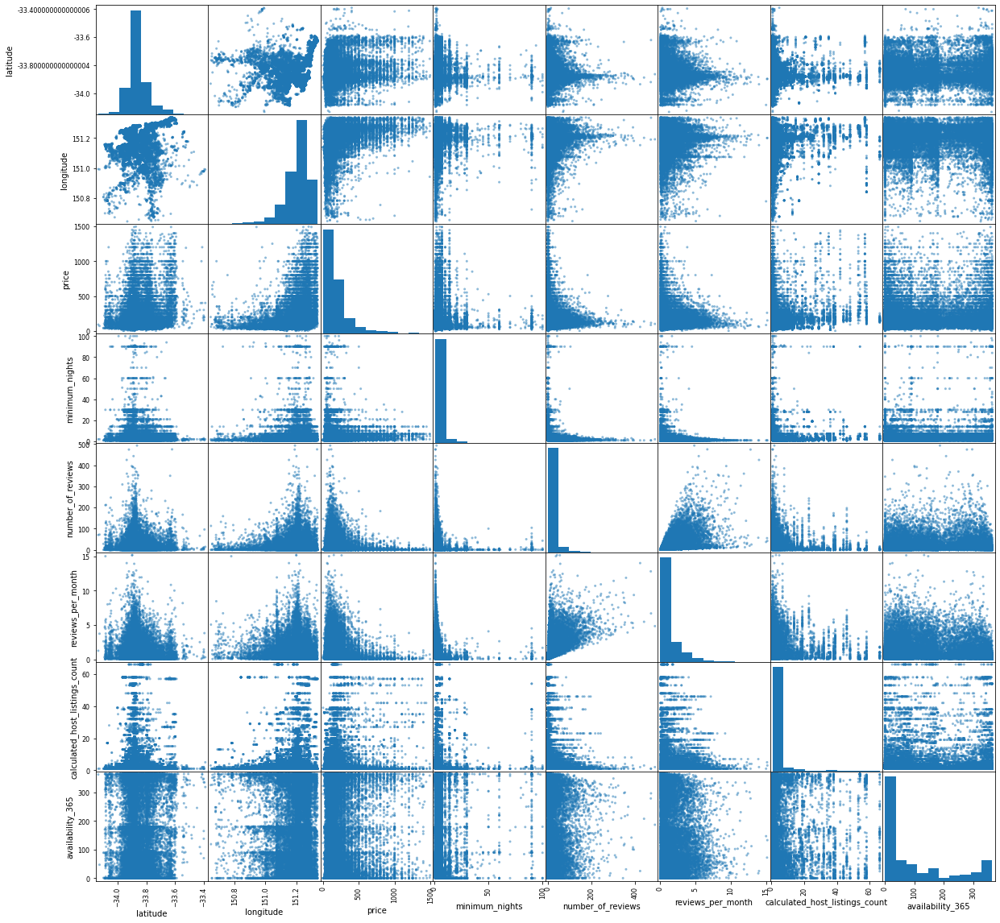

In [28]:
pd.plotting.scatter_matrix(df_fil_noches_hc[numericas], figsize=(20,20))
plt.show

> #### Diagramas de dispersión *sin outliers*

**Nota**: No importa si se utiliza hue con variables categóricas

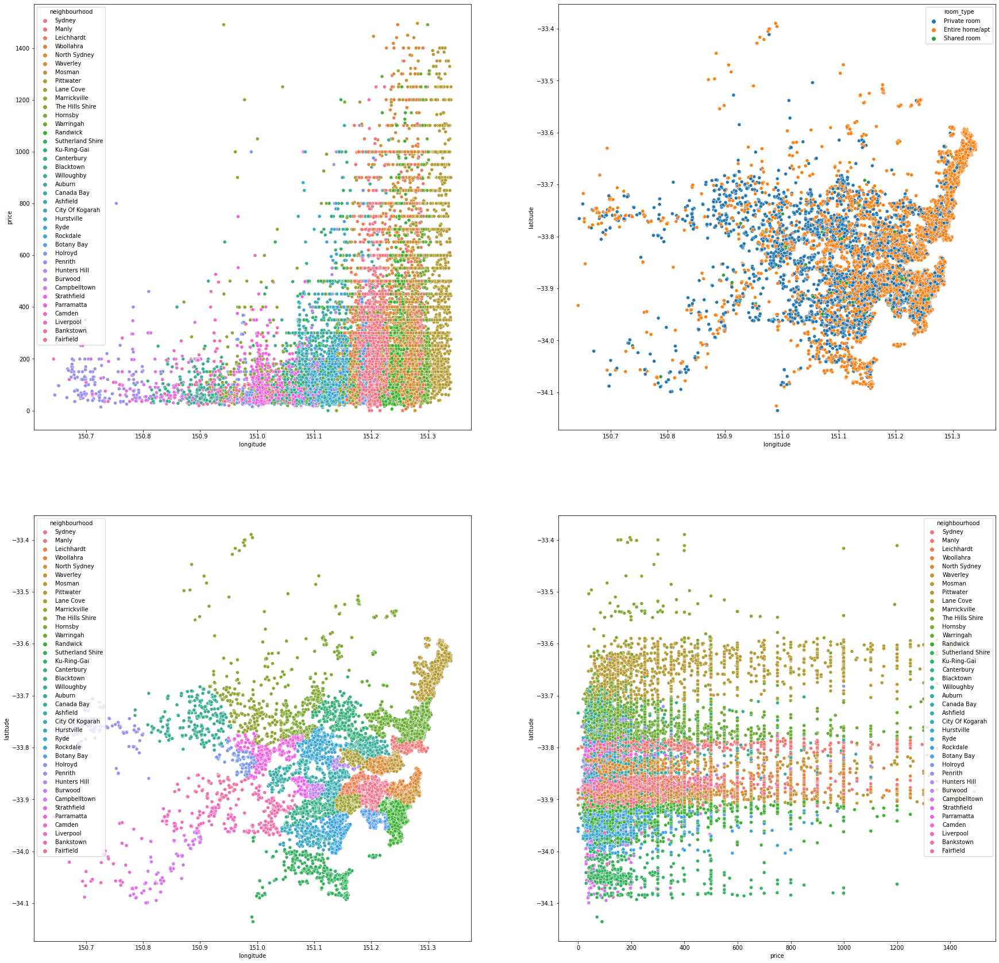

In [29]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(30, 30))

plt.subplot(2,2,1)
sns.scatterplot(x="longitude", y="price", data=df_fil_noches_hc, hue="neighbourhood")
plt.ylim()

plt.subplot(2,2,2)
sns.scatterplot(x="longitude", y="latitude", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(2,2,3)
sns.scatterplot(x="longitude", y="latitude", data=df_fil_noches_hc, hue="neighbourhood")
plt.ylim()

plt.subplot(2,2,4)
sns.scatterplot(x="price", y="latitude", data=df_fil_noches_hc, hue="neighbourhood")
plt.ylim()

plt.show()

-Scatterplot de las varialbes con mayor coorelación

> ## Diagramas de dispersión entre variables con mayor correlación

**Nota**: No importa si se utiliza hue con variables categóricas

> ## `number_of_review` & `reviews_per_month`------> Las dos variables con mayor correlación
> ## `minimum_nights` & `reviews_per_month`------> Las siguientes dos variables con mayor correlación


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


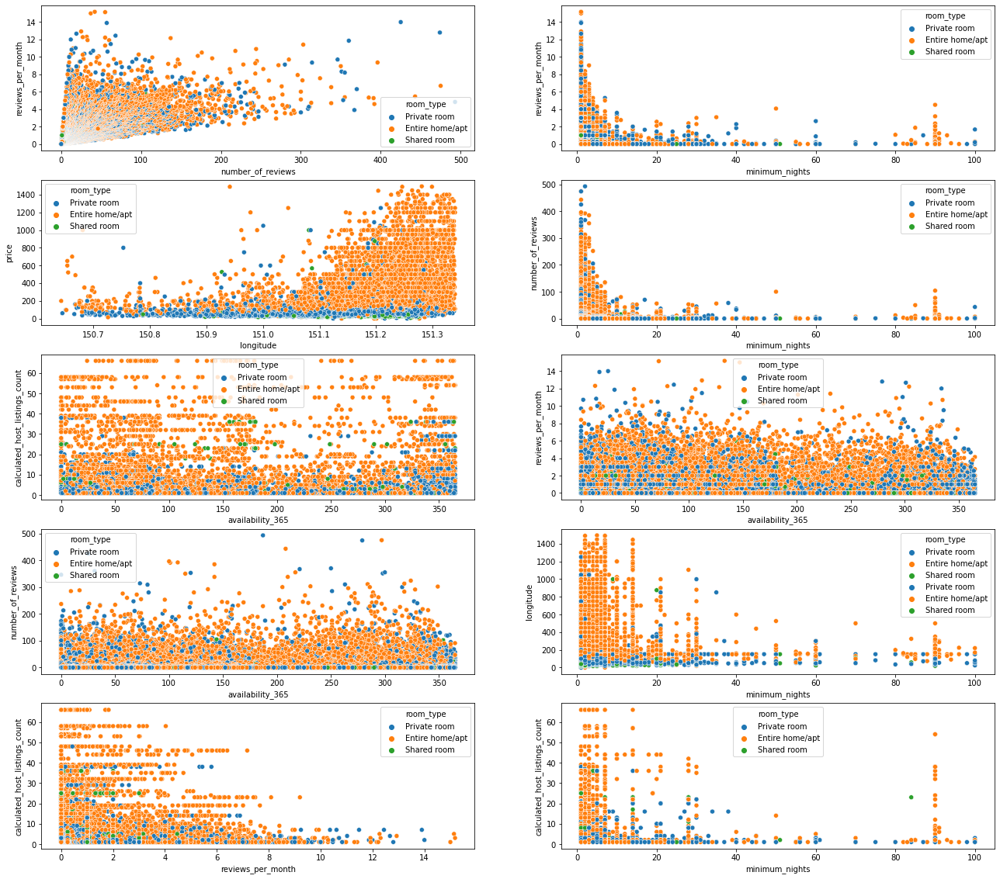

In [275]:
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(22, 20))

plt.subplot(5,2,1)
sns.scatterplot(x="number_of_reviews", y="reviews_per_month", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,2)
sns.scatterplot(x="minimum_nights", y="reviews_per_month", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,3)
sns.scatterplot(x="longitude", y="price", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,4)
sns.scatterplot(x="minimum_nights", y="number_of_reviews", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,5)
sns.scatterplot(x="availability_365", y="calculated_host_listings_count", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,6)
sns.scatterplot(x="availability_365", y="reviews_per_month", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,7)
sns.scatterplot(x="availability_365", y="number_of_reviews", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,8)
sns.scatterplot(x="minimum_nights", y="longitude", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,8)
sns.scatterplot(x="minimum_nights", y="price", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,9)
sns.scatterplot(x="reviews_per_month", y="calculated_host_listings_count", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.subplot(5,2,10)
sns.scatterplot(x="minimum_nights", y="calculated_host_listings_count", data=df_fil_noches_hc, hue="room_type")
plt.ylim()

plt.show()

# ----------------------------------------------------------------------------------------------

# 9. Análisis de variables agrupadas---->`.groupby`

In [49]:
df_fil_noches_hc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35473 entries, 0 to 36661
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              35473 non-null  int64   
 1   name                            35461 non-null  object  
 2   host_id                         35473 non-null  int64   
 3   host_name                       35467 non-null  object  
 4   neighbourhood                   35473 non-null  category
 5   latitude                        35473 non-null  float64 
 6   longitude                       35473 non-null  float64 
 7   room_type                       35473 non-null  object  
 8   price                           35473 non-null  int64   
 9   minimum_nights                  35473 non-null  int64   
 10  number_of_reviews               35473 non-null  int64   
 11  last_review                     24065 non-null  object  
 12  reviews_per_month 

* ### Tablas de variables agrupadas (columnas)

ID      
Neighbourhood        
Value.counts       
Prom. Price.    
Room Type

### Tabla de variables (columnas) agrupadas

ID      Neighbourhood        Value.counts       Prom. Price.    Room Type

In [39]:
df_fil_noches_hc.price.value_counts()

150    1654
100    1638
199    1339
60     1094
120    1051
       ... 
604       1
911       1
273       1
557       1
610       1
Name: price, Length: 546, dtype: int64

In [62]:
dates = df_fil_noches_hc.last_review.split()
dates

AttributeError: 'Series' object has no attribute 'split'

In [60]:
df_dates = df_fil_noches_hc.groupby(['neighbourhood','last_review']).aggregate('mean')
df_dates = df_dates.round(2)  # 2 decimales
df_dates

id       host_id  latitude  longitude  \
neighbourhood last_review                                                   
Ashfield      2014-10-31     363237.00  1.835730e+06    -33.89     151.14   
              2015-01-01    4787730.00  2.468048e+07    -33.90     151.11   
              2015-01-12    4448844.00  5.643405e+06    -33.88     151.13   
              2015-05-19    5550721.00  8.763000e+05    -33.89     151.12   
              2015-08-31    7891346.00  5.508258e+06    -33.89     151.14   
...                                ...           ...       ...        ...   
Woollahra     2018-12-03   19217988.67  5.045408e+07    -33.88     151.24   
              2018-12-04   18061649.27  5.552505e+07    -33.88     151.24   
              2018-12-05    9432391.00  4.732220e+06    -33.88     151.23   
              2018-12-06   21757522.67  9.518583e+07    -33.87     151.26   
              2018-12-07   22070561.00  1.600334e+08    -33.88     151.24   

                            price  minimum_nights  number_of_reviews  \
neighbourhood last_review                                              
Ashfield      2014-10-31    84.00            1.00               3.00   
              2015-01-01    54.00            1.00               1.00   
              2015-01-12    40.00            2.00               2.00   
              2015-05-19    65.00            7.00               3.00   
              2015-08-31    50.00            1.00               2.00   
...                           ...             ...                ...   
Woollahra     2018-12-03   150.78            2.44              43.22   
              2018-12-04   157.00            3.91              49.09   
              2018-12-05   406.00            2.00              40.00   
              2018-12-06   297.33            2.67              42.17   
              2018-12-07    65.00            1.00              19.00   

                           reviews_per_month  calculated_host_listings_count  \
neighbourhood last_review                                                      
Ashfield      2014-10-31                0.06                            1.00   
              2015-01-01                0.02                            1.00   
              2015-01-12                0.04                            1.00   
              2015-05-19                0.07                            1.00   
              2015-08-31                0.05                            1.00   
...                                      ...                             ...   
Woollahra     2018-12-03                2.85                            1.67   
              2018-12-04                3.25                            2.91   
              2018-12-05                1.12                            1.00   
              2018-12-06                2.51                            1.33   
              2018-12-07                1.62                            1.00   

                           availability_365  
neighbourhood last_review                    
Ashfield      2014-10-31               0.00  
              2015-01-01               0.00  
              2015-01-12               0.00  
              2015-05-19               0.00  
              2015-08-31               0.00  
...                                     ...  
Woollahra     2018-12-03             127.33  
              2018-12-04             160.73  
              2018-12-05             172.00  
              2018-12-06             161.50  
              2018-12-07             327.00  

[8739 rows x 10 columns]

In [61]:
# El nuevo data frame se convierte en archiv csv a través de la función .csv

df_dates.to_csv('dates.csv')

In [287]:
df_result = df_fil_noches_hc.groupby(['room_type','neighbourhood']).aggregate('mean')
df_result

id       host_id   latitude  \
room_type       neighbourhood                                            
Entire home/apt Ashfield         2.059445e+07  8.444929e+07 -33.887521   
                Auburn           2.312153e+07  1.184820e+08 -33.841398   
                Bankstown        2.237636e+07  1.064670e+08 -33.926086   
                Blacktown        2.314344e+07  1.235399e+08 -33.743352   
                Botany Bay       2.193351e+07  1.018618e+08 -33.931199   
...                                       ...           ...        ...   
Shared room     The Hills Shire  5.652423e+06  2.929415e+07 -33.756478   
                Warringah        1.996985e+07  9.509955e+07 -33.753794   
                Waverley         1.707658e+07  7.031233e+07 -33.889156   
                Willoughby       2.213880e+07  8.818070e+07 -33.797135   
                Woollahra        2.176696e+07  1.356123e+08 -33.884554   

                                  longitude       price  minimum_nights  \
room_type       neighbourhood                                             
Entire home/apt Ashfield         151.131504  177.540741        3.970370   
                Auburn           151.071353  181.288961        2.165584   
                Bankstown        151.025951  159.920000        3.240000   
                Blacktown        150.900596  147.298246        3.947368   
                Botany Bay       151.198784  186.261905        4.352381   
...                                     ...         ...             ...   
Shared room     The Hills Shire  151.001628   50.000000        5.000000   
                Warringah        151.288921   30.500000        2.000000   
                Waverley         151.269608   58.012048        4.457831   
                Willoughby       151.184237  228.222222        4.222222   
                Woollahra        151.257285   53.230769        4.846154   

                                 number_of_reviews  reviews_per_month  \
room_type       neighbourhood                                           
Entire home/apt Ashfield                 11.859259           0.912296   
                Auburn                   23.214286           2.268831   
                Bankstown                 8.440000           0.982800   
                Blacktown                13.631579           1.540175   
                Botany Bay               10.414286           1.102714   
...                                            ...                ...   
Shared room     The Hills Shire           0.000000           0.000000   
                Warringah                 9.000000           0.675000   
                Waverley                  2.204819           0.130843   
                Willoughby                2.333333           0.290000   
                Woollahra                 1.153846           0.088462   

                                 calculated_host_listings_count  \
room_type       neighbourhood                                     
Entire home/apt Ashfield                               3.614815   
                Auburn                                 9.561688   
                Bankstown                             10.080000   
                Blacktown                              2.350877   
                Botany Bay                             4.714286   
...                                                         ...   
Shared room     The Hills Shire                        1.000000   
                Warringah                              1.000000   
                Waverley                               4.951807   
                Willoughby                             1.666667   
                Woollahra                              1.538462   

                                 availability_365  neighbourhood_code  \
room_type       neighbourhood                                           
Entire home/apt Ashfield                90.703704                 0.0   
                Auburn                 112.438312              

In [57]:
df_fil_noches_hc.head(5)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,12351,Sydney City & Harbour at the door,17061,Stuart,Sydney,-33.865153,151.191896,Private room,100,2,493,2018-11-21,4.83,2,187
1,14250,Manly Harbour House,55948,Heidi,Manly,-33.800929,151.261722,Entire home/apt,471,5,1,2016-01-02,0.03,2,321
2,15253,Stunning Penthouse Apartment In Heart Of The City,59850,Morag,Sydney,-33.880455,151.216541,Private room,109,2,300,2018-11-16,3.63,2,316
3,20865,3 BED HOUSE + 1 BED STUDIO Balmain,64282,Fiona,Leichhardt,-33.859072,151.172753,Entire home/apt,450,7,15,2018-01-07,0.18,1,69
4,26174,"COZY PRIVATE ROOM, GREAT LOCATION!",110561,Amanda,Woollahra,-33.889087,151.259404,Private room,62,1,42,2018-11-23,0.45,1,140


* DataFrame con valores importantes tal no se que era pero creo que era asi

* Sólo dejamos las variables que nos interesa para graficar

In [288]:
df_tabla = df_result.drop([ 'id' , 'host_id' , 'latitude' , 'longitude'], axis=1)
df_tabla

price  minimum_nights  \
room_type       neighbourhood                                 
Entire home/apt Ashfield         177.540741        3.970370   
                Auburn           181.288961        2.165584   
                Bankstown        159.920000        3.240000   
                Blacktown        147.298246        3.947368   
                Botany Bay       186.261905        4.352381   
...                                     ...             ...   
Shared room     The Hills Shire   50.000000        5.000000   
                Warringah         30.500000        2.000000   
                Waverley          58.012048        4.457831   
                Willoughby       228.222222        4.222222   
                Woollahra         53.230769        4.846154   

                                 number_of_reviews  reviews_per_month  \
room_type       neighbourhood                                           
Entire home/apt Ashfield                 11.859259           0.912296   
                Auburn                   23.214286           2.268831   
                Bankstown                 8.440000           0.982800   
                Blacktown                13.631579           1.540175   
                Botany Bay               10.414286           1.102714   
...                                            ...                ...   
Shared room     The Hills Shire           0.000000           0.000000   
                Warringah                 9.000000           0.675000   
                Waverley                  2.204819           0.130843   
                Willoughby                2.333333           0.290000   
                Woollahra                 1.153846           0.088462   

                                 calculated_host_listings_count  \
room_type       neighbourhood                                     
Entire home/apt Ashfield                               3.614815   
                Auburn                                 9.561688   
                Bankstown                             10.080000   
                Blacktown                              2.350877   
                Botany Bay                             4.714286   
...                                                         ...   
Shared room     The Hills Shire                        1.000000   
                Warringah                              1.000000   
                Waverley                               4.951807   
                Willoughby                             1.666667   
                Woollahra                              1.538462   

                                 availability_365  neighbourhood_code  \
room_type       neighbourhood                                           
Entire home/apt Ashfield                90.703704                 0.0   
                Auburn                 112.438312                 1.0   
                Bankstown              180.680000                 2.0   
                Blacktown              133.824561                 3.0   
                Botany Bay              75.057143                 4.0   
...                                           ...                 ...   
Shared room     The Hills Shire          0.000000                33.0   
                Warringah                1.000000                34.0   
                Waverley                70.469880                35.0   
                Willoughby             156.111111                36.0   
                Woollahra               42.153846                37.0   

                                 log_price  
room_type       neighbourhood               
Entire home/apt Ashfield          5.018832  
                Auburn            5.120677  
                Bankstown         4.915568  
                Blacktown         4.844962  
                Botany Bay        5.082266  
...                                    ...  
Shared room     The Hills Shire   3.931826  
                Warringah         3.40230

* **Convertir las primeras columnas del groupby_DataFrame en columnas normales**


In [289]:
df_tabla.index

MultiIndex([('Entire home/apt',         'Ashfield'),
            ('Entire home/apt',           'Auburn'),
            ('Entire home/apt',        'Bankstown'),
            ('Entire home/apt',        'Blacktown'),
            ('Entire home/apt',       'Botany Bay'),
            ('Entire home/apt',          'Burwood'),
            ('Entire home/apt',           'Camden'),
            ('Entire home/apt',     'Campbelltown'),
            ('Entire home/apt',       'Canada Bay'),
            ('Entire home/apt',       'Canterbury'),
            ...
            (    'Shared room',         'Rockdale'),
            (    'Shared room',             'Ryde'),
            (    'Shared room',      'Strathfield'),
            (    'Shared room', 'Sutherland Shire'),
            (    'Shared room',           'Sydney'),
            (    'Shared room',  'The Hills Shire'),
            (    'Shared room',        'Warringah'),
            (    'Shared room',         'Waverley'),
            (    'Shared room'

In [290]:
df_tabla = df_tabla.reset_index(level=0)
df_tabla.head(2)

,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,log_price
neighbourhood,,,,,,,,,
Ashfield,Entire home/apt,177.540741,3.970370,11.859259,0.912296,3.614815,90.703704,0.0,5.018832
Auburn,Entire home/apt,181.288961,2.165584,23.214286,2.268831,9.561688,112.438312,1.0,5.120677
Bankstown,Entire home/apt,159.920000,3.240000,8.440000,0.982800,10.080000,180.680000,2.0,4.915568
Blacktown,Entire home/apt,147.298246,3.947368,13.631579,1.540175,2.350877,133.824561,3.0,4.844962
Botany Bay,Entire home/apt,186.261905,4.352381,10.414286,1.102714,4.714286,75.057143,4.0,5.082266


In [292]:
df_tabla = df_tabla.reset_index(level=0)
df_tabla.head(2)

,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,log_price
0,Ashfield,Entire home/apt,177.540741,3.970370,11.859259,0.912296,3.614815,90.703704,0.0,5.018832
1,Auburn,Entire home/apt,181.288961,2.165584,23.214286,2.268831,9.561688,112.438312,1.0,5.120677


In [293]:
df_tabla = df_tabla.round(2) #Este df tiene todas las columnas de variables numericas

In [15]:
# El nuevo data frame se convierte en archiv csv a través de la función .csv

df_tabla.to_csv('groupby.csv')

In [284]:
#Si quieres redondear todos los numeros del DF haces:

df_result = df_result.round(2)  # 2 decimales
df_result

id       host_id  latitude  \
room_type       neighbourhood                                          
Entire home/apt Ashfield         20594446.07  8.444929e+07    -33.89   
                Auburn           23121533.60  1.184820e+08    -33.84   
                Bankstown        22376361.54  1.064670e+08    -33.93   
                Blacktown        23143437.56  1.235399e+08    -33.74   
                Botany Bay       21933508.30  1.018618e+08    -33.93   
...                                      ...           ...       ...   
Shared room     The Hills Shire   5652423.00  2.929415e+07    -33.76   
                Warringah        19969854.50  9.509955e+07    -33.75   
                Waverley         17076579.40  7.031233e+07    -33.89   
                Willoughby       22138795.44  8.818070e+07    -33.80   
                Woollahra        21766957.31  1.356123e+08    -33.88   

                                 longitude   price  minimum_nights  \
room_type       neighbourhood                                        
Entire home/apt Ashfield            151.13  177.54            3.97   
                Auburn              151.07  181.29            2.17   
                Bankstown           151.03  159.92            3.24   
                Blacktown           150.90  147.30            3.95   
                Botany Bay          151.20  186.26            4.35   
...                                    ...     ...             ...   
Shared room     The Hills Shire     151.00   50.00            5.00   
                Warringah           151.29   30.50            2.00   
                Waverley            151.27   58.01            4.46   
                Willoughby          151.18  228.22            4.22   
                Woollahra           151.26   53.23            4.85   

                                 number_of_reviews  reviews_per_month  \
room_type       neighbourhood                                           
Entire home/apt Ashfield                     11.86               0.91   
                Auburn                       23.21               2.27   
                Bankstown                     8.44               0.98   
                Blacktown                    13.63               1.54   
                Botany Bay                   10.41               1.10   
...                                            ...                ...   
Shared room     The Hills Shire               0.00               0.00   
                Warringah                     9.00               0.68   
                Waverley                      2.20               0.13   
                Willoughby                    2.33               0.29   
                Woollahra                     1.15               0.09   

                                 calculated_host_listings_count  \
room_type       neighbourhood                                     
Entire home/apt Ashfield                                   3.61   
                Auburn                                     9.56   
                Bankstown                                 10.08   
                Blacktown                                  2.35   
                Botany Bay                                 4.71   
...                                                         ...   
Shared room     The Hills Shire                            1.00   
                Warringah                                  1.00   
                Waverley                                   4.95   
                Willoughby                                 1.67   
                Woollahra                                  1.54   

                                 availability_365  neighbourhood_code  \
room_type       neighbourhood                                           
Entire home/apt Ashfield                    90.70                 0.0   
                Auburn                     112.44                 1.0   
                Bankstown                  180.68                 2.0   
       

In [53]:
df_result = df_result.drop([ 'id' , 'host_id'], axis=1)
df_result

latitude  longitude   price  minimum_nights  \
room_type       neighbourhood                                                  
Entire home/apt Ashfield           -33.89     151.13  177.54            3.97   
                Auburn             -33.84     151.07  181.29            2.17   
                Bankstown          -33.93     151.03  159.92            3.24   
                Blacktown          -33.74     150.90  147.30            3.95   
                Botany Bay         -33.93     151.20  186.26            4.35   
...                                   ...        ...     ...             ...   
Shared room     The Hills Shire    -33.76     151.00   50.00            5.00   
                Warringah          -33.75     151.29   30.50            2.00   
                Waverley           -33.89     151.27   58.01            4.46   
                Willoughby         -33.80     151.18  228.22            4.22   
                Woollahra          -33.88     151.26   53.23            4.85   

                                 number_of_reviews  reviews_per_month  \
room_type       neighbourhood                                           
Entire home/apt Ashfield                     11.86               1.26   
                Auburn                       23.21               2.74   
                Bankstown                     8.44               1.26   
                Blacktown                    13.63               2.00   
                Botany Bay                   10.41               1.67   
...                                            ...                ...   
Shared room     The Hills Shire               0.00                NaN   
                Warringah                     9.00               0.68   
                Waverley                      2.20               0.30   
                Willoughby                    2.33               0.65   
                Woollahra                     1.15               0.38   

                                 calculated_host_listings_count  \
room_type       neighbourhood                                     
Entire home/apt Ashfield                                   3.61   
                Auburn                                     9.56   
                Bankstown                                 10.08   
                Blacktown                                  2.35   
                Botany Bay                                 4.71   
...                                                         ...   
Shared room     The Hills Shire                            1.00   
                Warringah                                  1.00   
                Waverley                                   4.95   
                Willoughby                                 1.67   
                Woollahra                                  1.54   

                                 availability_365  
room_type       neighbourhood                      
Entire home/apt Ashfield                    90.70  
                Auburn                     112.44  
                Bankstown                  180.68  
                Blacktown                  133.82  
                Botany Bay                  75.06  
...                                           ...  
Shared room     The Hills Shire              0.00  
                Warringah                    1.00  
                Waverley                    70.47  
                Willoughby                 156.11  
                Woollahra                   42.15  

[111 rows x 8 columns]

In [54]:
df_result.head(5)

latitude  longitude   price  minimum_nights  \
room_type       neighbourhood                                                
Entire home/apt Ashfield         -33.89     151.13  177.54            3.97   
                Auburn           -33.84     151.07  181.29            2.17   
                Bankstown        -33.93     151.03  159.92            3.24   
                Blacktown        -33.74     150.90  147.30            3.95   
                Botany Bay       -33.93     151.20  186.26            4.35   

                               number_of_reviews  reviews_per_month  \
room_type       neighbourhood                                         
Entire home/apt Ashfield                   11.86               1.26   
                Auburn                     23.21               2.74   
                Bankstown                   8.44               1.26   
                Blacktown                  13.63               2.00   
                Botany Bay                 10.41               1.67   

                               calculated_host_listings_count  \
room_type       neighbourhood                                   
Entire home/apt Ashfield                                 3.61   
                Auburn                                   9.56   
                Bankstown                               10.08   
                Blacktown                                2.35   
                Botany Bay                               4.71   

                               availability_365  
room_type       neighbourhood                    
Entire home/apt Ashfield                  90.70  
                Auburn                   112.44  
                Bankstown                180.68  
                Blacktown                133.82  
                Botany Bay                75.06

In [55]:
#Si quieres redondear todos los numeros del DF haces:

df_result = df_result[['price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','latitude','longitude']]
df_result.head(5)

price  minimum_nights  number_of_reviews  \
room_type       neighbourhood                                              
Entire home/apt Ashfield       177.54            3.97              11.86   
                Auburn         181.29            2.17              23.21   
                Bankstown      159.92            3.24               8.44   
                Blacktown      147.30            3.95              13.63   
                Botany Bay     186.26            4.35              10.41   

                               reviews_per_month  \
room_type       neighbourhood                      
Entire home/apt Ashfield                    1.26   
                Auburn                      2.74   
                Bankstown                   1.26   
                Blacktown                   2.00   
                Botany Bay                  1.67   

                               calculated_host_listings_count  \
room_type       neighbourhood                                   
Entire home/apt Ashfield                                 3.61   
                Auburn                                   9.56   
                Bankstown                               10.08   
                Blacktown                                2.35   
                Botany Bay                               4.71   

                               availability_365  latitude  longitude  
room_type       neighbourhood                                         
Entire home/apt Ashfield                  90.70    -33.89     151.13  
                Auburn                   112.44    -33.84     151.07  
                Bankstown                180.68    -33.93     151.03  
                Blacktown                133.82    -33.74     150.90  
                Botany Bay                75.06    -33.93     151.20

* Creacion de archivo .CSV para utilizar en el demo.

In [56]:
# El nuevo data frame se convierte en archiv csv a través de la función .csv

df_result.to_csv('groupby2.csv')

* ### Visualización gráfica de variables agrupadas

ID      Neighbourhood        Value.counts       Prom. Price.    Room Type

In [60]:
df_tabla.head(3)

,room_type,neighbourhood,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code
0,Entire home/apt,Ashfield,177.540741,3.97037,11.859259,1.256735,3.614815,90.703704,0.0
1,Private room,Ashfield,62.986667,3.74000,8.453333,1.000737,3.780000,113.933333,0.0
2,Shared room,Ashfield,24.500000,4.25000,2.800000,0.738750,25.900000,245.650000,0.0


>### catplot --->gráfico variables categoricas (como sexo y survive del Titanic) 

In [ ]:
#sns.catplot(x ='neighbourhood', hue ='Survived', kind ='count', col ='room_type', data = df)


In [75]:
df_fil_noches_hc.price.describe()

count    35473.000000
mean       186.909791
std        183.182324
min          0.000000
25%         78.000000
50%        130.000000
75%        217.000000
max       1495.000000
Name: price, dtype: float64

* **¿Por qué si el máximo de `price`es 1495 en *df_fil_noches_hc*, en el sns.catplot me grafica precios solo hasta 600?**

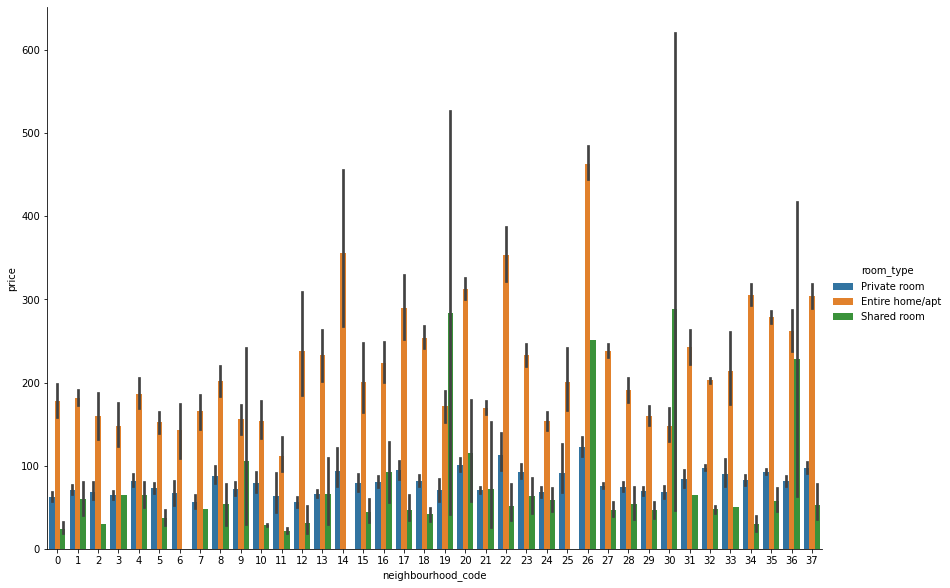

In [70]:
sns.catplot(data=df_fil_noches_hc, x='neighbourhood_code', y='price',kind ='bar', 
            hue='room_type', height=8.27, aspect=11.7/8.27)

<Figure size 144x144 with 0 Axes>

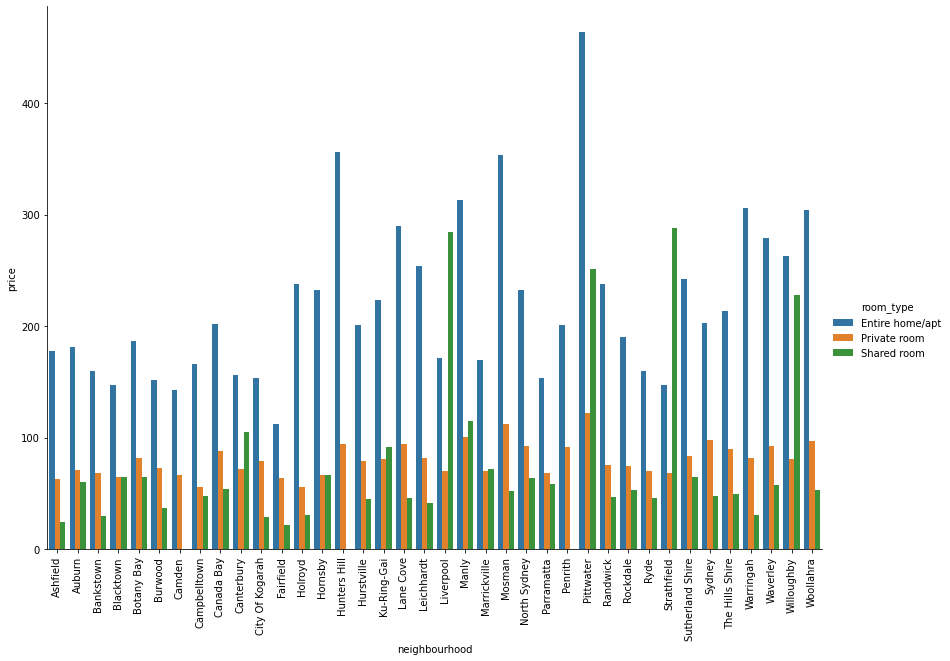

In [71]:
plt.figure(figsize=(2,2))
sns.catplot(x ='neighbourhood', y='price', hue ='room_type', kind ='bar', data = df_tabla, height=8.27, aspect=11.7/8.27)
plt.xticks(rotation=90)
plt.show()

In [89]:
Entire_home = df_fil_noches_hc.loc[:, 'room_type'] == 'Entire home/apt'
df_Entire_home = df_fil_noches_hc.loc[Entire_home]
df_Entire_home.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21781 entries, 1 to 36660
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              21781 non-null  int64   
 1   name                            21777 non-null  object  
 2   host_id                         21781 non-null  int64   
 3   host_name                       21777 non-null  object  
 4   neighbourhood                   21781 non-null  category
 5   latitude                        21781 non-null  float64 
 6   longitude                       21781 non-null  float64 
 7   room_type                       21781 non-null  object  
 8   price                           21781 non-null  int64   
 9   minimum_nights                  21781 non-null  int64   
 10  number_of_reviews               21781 non-null  int64   
 11  last_review                     15309 non-null  object  
 12  reviews_per_month 

In [87]:
Private_room = df_fil_noches_hc.loc[:, 'room_type'] == 'Private room'
df_Private_room = df_fil_noches_hc.loc[Private_room]
df_Private_room.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13064 entries, 0 to 36661
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              13064 non-null  int64   
 1   name                            13058 non-null  object  
 2   host_id                         13064 non-null  int64   
 3   host_name                       13062 non-null  object  
 4   neighbourhood                   13064 non-null  category
 5   latitude                        13064 non-null  float64 
 6   longitude                       13064 non-null  float64 
 7   room_type                       13064 non-null  object  
 8   price                           13064 non-null  int64   
 9   minimum_nights                  13064 non-null  int64   
 10  number_of_reviews               13064 non-null  int64   
 11  last_review                     8444 non-null   object  
 12  reviews_per_month 

In [228]:
Shared_room = df_fil_noches_hc.loc[:, 'room_type'] == 'Shared room'
df_Shared_room = df_fil_noches_hc.loc[Shared_room]
df_Shared_room.head (5)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_code,Host_name_and_Id
240,651796,"Maroubra Junction, Eastern Suburbs",3275877,Elle,Randwick,-33.946527,151.242427,Shared room,75,2,0,NaN,NaN,1,0,27,"Elle, Id:3275877"
1470,2667767,A humble apartment in a nice suburb,13656336,Jin,Sydney,-33.879078,151.186253,Shared room,91,1,7,2018-02-22,0.12,1,363,32,"Jin, Id:13656336"
1579,2879387,affordable rooms at prime location,14702243,James,Sydney,-33.879185,151.186857,Shared room,126,1,1,2018-03-16,0.11,2,364,32,"James, Id:14702243"
1718,3168890,cozy room in nice suburb,14702243,James,Sydney,-33.879345,151.185092,Shared room,123,1,0,NaN,NaN,2,363,32,"James, Id:14702243"
1782,3284239,"Close to airport, beach and Novotel",14432012,Catriona,Rockdale,-33.960027,151.153648,Shared room,120,2,37,2018-11-24,0.73,2,25,28,"Catriona, Id:14432012"


<function matplotlib.pyplot.show(close=None, block=None)>

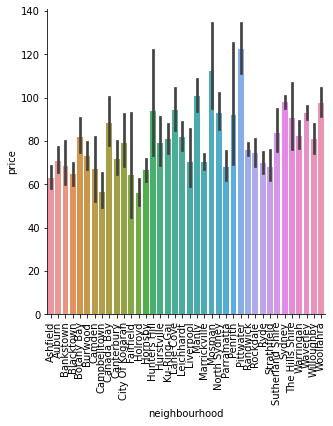

In [147]:
sns.catplot(x ='neighbourhood', y='price', kind ='bar', data = df_Private_room)
plt.xticks(rotation=90)
plt.ylim()

plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

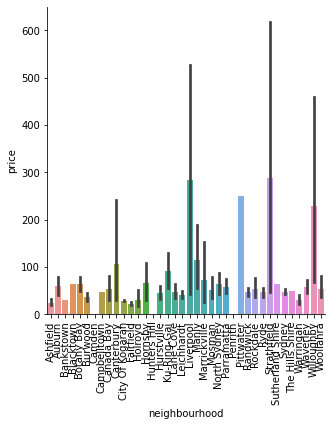

In [148]:
sns.catplot(x ='neighbourhood', y='price', kind ='bar', data = df_Shared_room)
plt.xticks(rotation=90)
plt.ylim()

plt.show


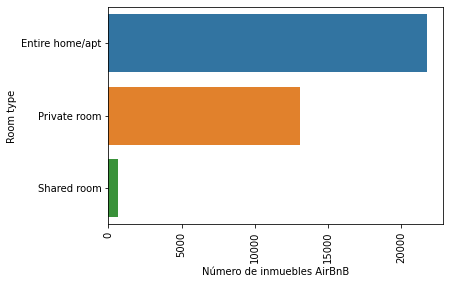

In [43]:
#plt.figure(figsize=(10,6))
sns.barplot(x = "Número de inmuebles AirBnB", y = "Room type", data = room_type_value)
#plt.xticks(rotation=90)
plt.show()

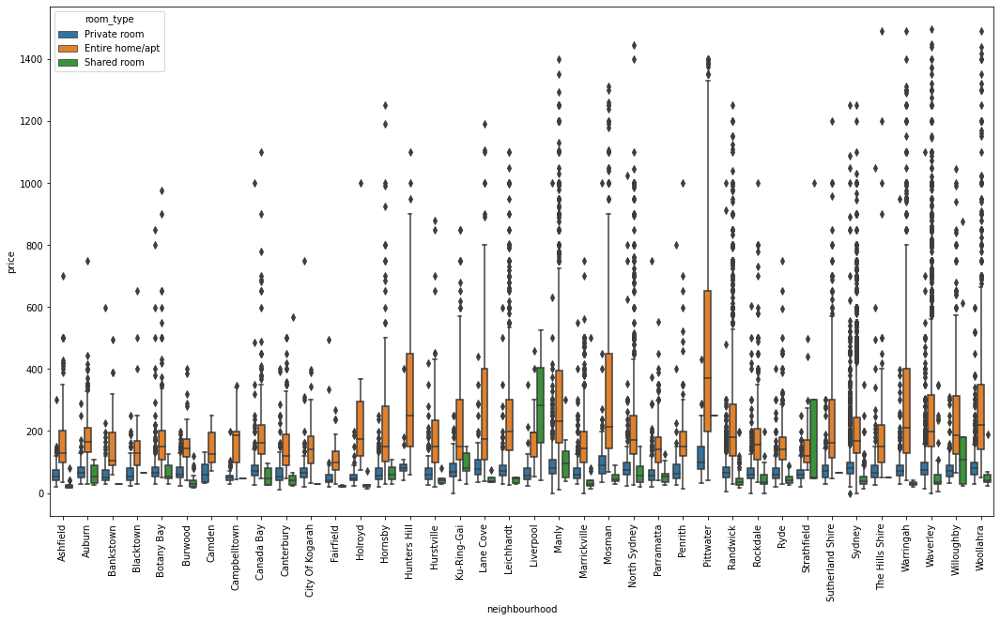

In [121]:
plt.figure(figsize=(18,10))
a= sns.boxplot(x="neighbourhood", y="price",hue="room_type",data=df_fil_noches_hc)

#sns.despine(offset=10, trim=True)

a.set_xticklabels(a.get_xticklabels(),rotation=90)

plt.show()


* **Agrupamos `host_id` y `host_name` para ver si nos puede servir de algo el dejar solo una fila para cada host**

In [99]:
df_cosa = df_fil_noches_hc.groupby(['host_id','host_name']).aggregate('min')
df_cosa.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 27028 entries, (8346, 'Melody') to (229479027, 'Sofei & Kelvin')
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              27028 non-null  int64  
 1   latitude                        27028 non-null  float64
 2   longitude                       27028 non-null  float64
 3   room_type                       27028 non-null  object 
 4   price                           27028 non-null  int64  
 5   minimum_nights                  27028 non-null  int64  
 6   number_of_reviews               27028 non-null  int64  
 7   reviews_per_month               18537 non-null  float64
 8   calculated_host_listings_count  27028 non-null  int64  
 9   availability_365                27028 non-null  int64  
 10  neighbourhood_code              27028 non-null  int8   
 11  Host_name_and_Id                27028 non-null  object

/var/folders/2z/y9k9szx937n84ztg148l8rd00000gn/T/ipykernel_91475/1227917580.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.min is deprecated. In a future version, a TypeError will be raised. Before calling .min, select only columns which should be valid for the function.
  df_cosa = df_fil_noches_hc.groupby(['host_id','host_name']).aggregate('min')


# 10. Gráficos y tablas para usar en el Streamlit

### Hay que hacer un DataFrame con "reviews_per_month ", "availability_365", "minimum_nights"

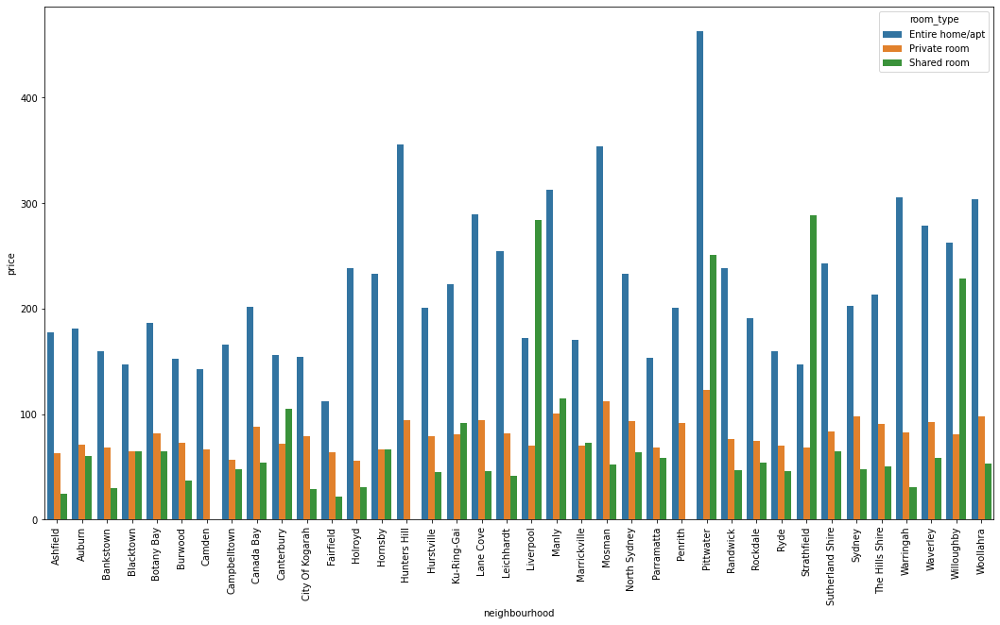

In [294]:
plt.figure(figsize=(18,10))
sns.barplot(data = df_tabla, x = 'neighbourhood', y = 'price', hue='room_type')
plt.xticks(rotation=90)
plt.show()

#sns.countplot(x = 'neighbourhood', data=datos, order = datos['neighbourhood'].value_counts().index)

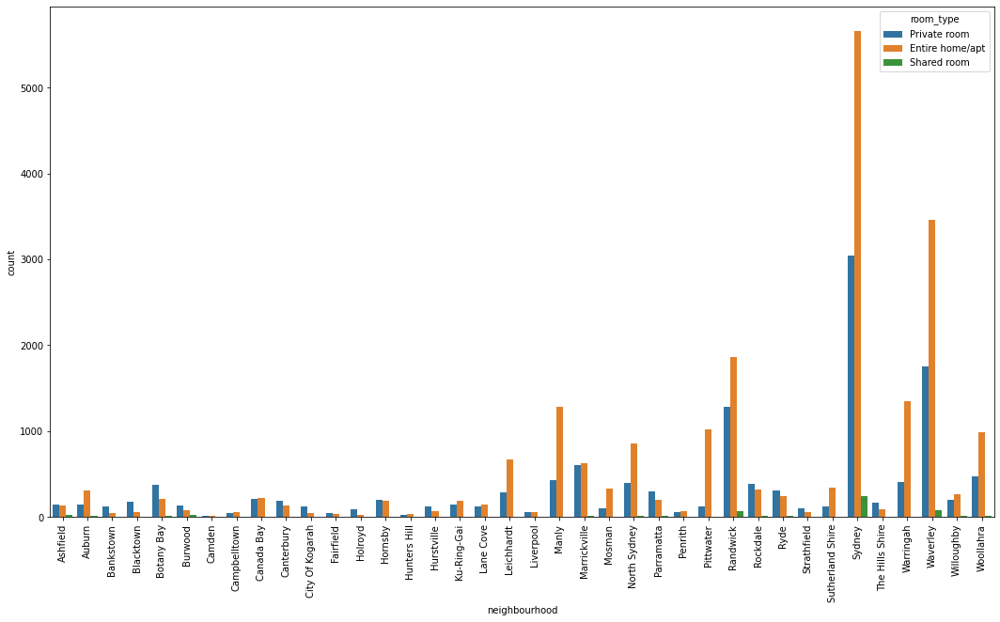

In [278]:
plt.figure(figsize=(18,10))
sns.countplot(data = df_fil_noches_hc, x = 'neighbourhood', hue='room_type')
plt.xticks(rotation=90)
plt.show()

#sns.countplot(x = 'neighbourhood', data=datos, order = datos['neighbourhood'].value_counts().index)

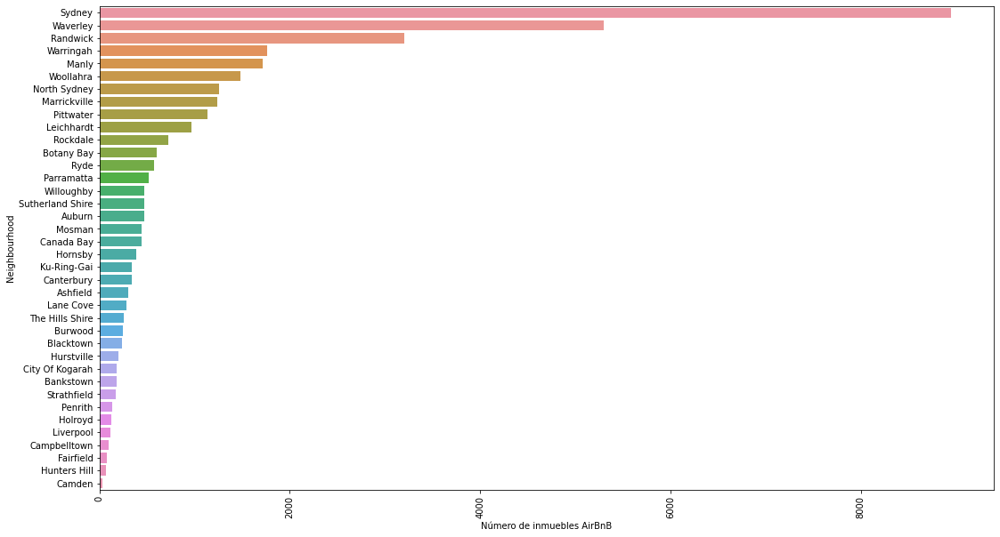

In [268]:
plt.figure(figsize=(18,10))
sns.barplot(x = "Número de inmuebles AirBnB", y = "Neighbourhood", data = neighbourhood_value)
plt.xticks(rotation=90)
plt.show()

# ----------------------------------------------------------------------------------------------

# 11. Mapa interactivo de Sydney Australia (follium)

plt.figure(figsize=(14,10))
sns.heatmap(df_fil_noches_hc[numericas].corr(), anno----t=True)

In [ ]:
import streamlit as st
from streamlit_folium import st_folium
import folium as folium

**Stamen Terrain (tesela raster)**

  **Stamen Toner (tesela raster)**

tiles='Stamen Terrain'

tiles='Stamen Toner'

tiles='OpenStreetMap' 

> *Mapeo de ubicaciones de los inmuebles AirBnB a arrendar en Sidney*

* **Información de Sydney Australia**

*Coordenadas geográficas de Sídney* 	

Latitud: -33.8667, 

Longitud: 151.2 33° 52′ 0″ Sur, 
          151° 12′ 0″ Este

import folium

m = folium.Map(location=[-33.8667,151.2])
m

* **Ejemplo de mapa de Sidney con un único marcador de la Ópera de Sidney.**

In [ ]:
m = folium.Map(
    location=[-33.86785,151.20732],
    zoom_start=12,
    tiles='Stamen Terrain'
)

folium.Marker([-33.8567844, 151.2152967], popup='Ópera de Sidney', tooltip='Ópera de Sidney').add_to(m)


m


#Ópera de Sidney

#Latitud: -33.8567844. Longitud: 151.2152967 


* **Este sería el ócdigo para que muestre todos los marcadores de la base de datos de AirBnB de Sidney.**

* **Este codigo demora mucho en correr, en realidad no termina de correr.**

* **Si colocamos un condicional `ìf` con alguna otra variable, si que lo gramos visualizar los marcadores bajo el filtro del condicional (porque son mucho menos datos)**

map = folium.Map(
    location=[-33.86785,151.20732],
    zoom_start=12,
    tiles='Stamen Terrain'
)

for index, row in df.iterrows():
        tooltip = row['name']
        map.add_child(folium.Marker((row['latitude'], row['longitude']), popup=row['name'], tooltip=tooltip).add_to(map))
        
map
       


In [77]:
m = folium.Map(
    location=[-33.86785,151.20732],
    zoom_start=12,
    tiles='Stamen Terrain'
)

for index, row in df.iterrows():
    if row["neighbourhood"]=="Manly":
        tooltip = row['name']
        m.add_child(folium.Marker((row['latitude'], row['longitude']), popup=row['name'], tooltip=tooltip).add_to(m))

m

# ----------------------------------------------------------------------------------------------

# 12. Conclusiones de este Pre-Procesado de Datos









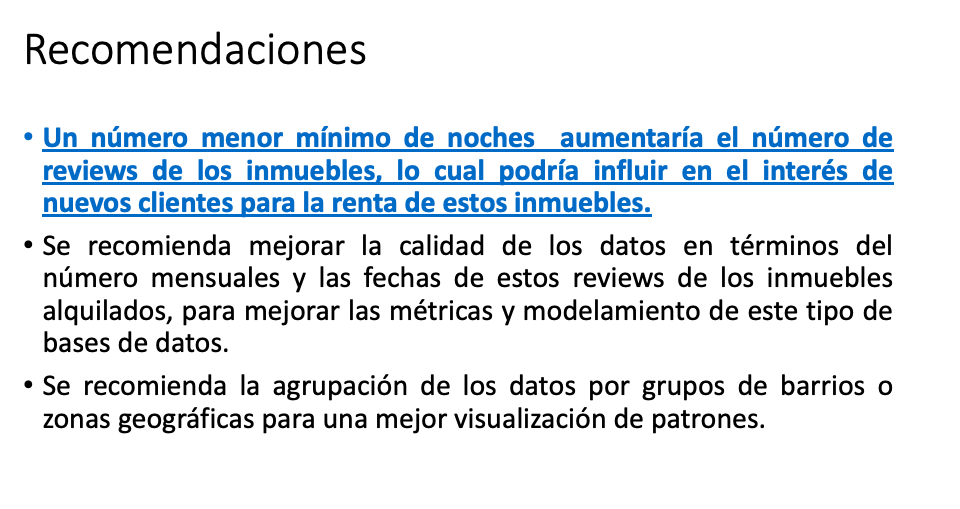





### Tablero de trabajo (desarrollo del proyecto) : Link Trello

### Panel de Visualización de datos (link Streamlit)